In [2]:
import os
import sys
import numpy as np
from sklearn.decomposition import PCA

from umap import UMAP
sys.path.insert(1, os.getenv("MOMAPS_HOME"))
from src.common.lib.utils import load_config_file
from src.datasets.dataset_spd import DatasetSPD
from src.common.lib.embeddings_utils import load_embeddings
import src.common.lib.synthetic_multiplexing as synthetic_multiplexing

from matplotlib import cm
import matplotlib.pyplot as plt

from sklearn.metrics import precision_recall_curve, average_precision_score, roc_curve, auc, RocCurveDisplay, \
    balanced_accuracy_score, roc_auc_score, classification_report, confusion_matrix, multilabel_confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
import matplotlib
from collections import defaultdict, Counter

from sklearn.preprocessing import label_binarize

from sklearn.base import clone

%matplotlib inline
%load_ext autoreload 
%autoreload 2





/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/labs/hornsteinla

MOMAPS_HOME: /home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps


# utils

In [3]:
def fit_and_plot_multiclass_cv_auc_roc_curves(estimator, cv_k_fold, X, y, n_classes,
                                              class_names, colors, sample_weight=None, title="", minimal_legend=False):
    """
    For every class, plot a curve per fold.
    A total of (n_classes * n_folds) AUC ROC curves are presented in the plot
    :param estimator:
    :param cv_k_fold:
    :param X:
    :param y:
    :param n_classes:
    :param title:
    :return:
    """

    tprs, aucs = [], []
    mean_fpr = np.linspace(0, 1, 100)
    _tpr, _fpr, _roc_auc = dict(), dict(), dict()
    _roc_auc2 = defaultdict(list)
    fig, ax = plt.subplots(figsize=(5, 5))
    

    for i, (train_fold, test_fold) in enumerate(cv_k_fold.split(X, y)):
        estimator_copy = clone(estimator)
        # -------- -------- -------- -------- -------- --------
        # Train a model on the train set
        estimator_copy.fit(X[train_fold], y[train_fold])
        # Get the true labels (classes)
        # Binarize labels in a one-vs-all fashion
        y_true = label_binarize(y[test_fold], classes=class_names)
        # -------- -------- -------- -------- -------- --------
        # Validate on test set
        y_proba = estimator_copy.predict_proba(X[test_fold])
        # -------- -------- -------- -------- -------- --------
        # For every class, plot a curve per fold (n_class * n_folds)
        for j, class_color, class_name in zip(range(n_classes), colors, class_names):

            # calculate AUC ROC - generate TPR and FPR curves
            _fpr[j], _tpr[j], _ = roc_curve(y_true[:, j],
                                          y_proba[:, j],
                                          #sample_weight=sample_weight,
                                          drop_intermediate=True)

            _roc_auc[j] = auc(_fpr[j], _tpr[j])
            _roc_auc2[class_name].append(_roc_auc[j])

            viz = RocCurveDisplay(fpr=_fpr[j], tpr=_tpr[j], roc_auc=_roc_auc[j], estimator_name=class_name)
            # Set a legend for each fold and each class
            viz.plot(ax=ax, name=class_name + ' fold {}'.format(i + 1), alpha=0.8, lw=1.8, linestyle=':',
                         color=class_color)

            interp_tpr = np.interp(mean_fpr, viz.fpr, viz.tpr)
            interp_tpr[0] = 0.0
            tprs.append(interp_tpr)
            aucs.append(viz.roc_auc)
        # -------- -------- -------- -------- -------- --------

    ax.plot([0, 1], [0, 1], linestyle='--', lw=2, color='dimgray', label='Chance', alpha=.5)

    mean_tpr = np.mean(tprs, axis=0)
    mean_tpr[-1] = 1.0
    mean_auc = auc(mean_fpr, mean_tpr)
    std_auc = np.std(aucs)
    ax.plot(mean_fpr, mean_tpr, color='black',
            label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc),
            lw=2, alpha=1.0)

    std_tpr = np.std(tprs, axis=0)
    tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
    tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
    ax.fill_between(mean_fpr, tprs_lower, tprs_upper, color='grey', alpha=.2,
                    label=r'$\pm$ 1 std. dev.')

    ax.set(xlim=[-0.01, 1.05], ylim=[-0.01, 1.05])

    plt.title(title, color='black', fontsize=20)
    plt.xlabel('False Positive Rate (%)', fontsize=20, color='black')
    plt.ylabel('True Positive Rate (%)', fontsize=20, color='black')

    ax.legend(loc="lower right", prop={"size": 14}, bbox_to_anchor=(1.5, 1.5))

    plt.show()
    # plt.savefig(os.path.join(MAIN_FOLDER, 'figures', 'multiclass', 'AUC_ROC_per_class_training.png'), bbox_inches='tight',
    #             dpi=1200)
    plt.close()
    return np.asarray(aucs)

def plot_conf_matrix(clf, X_test, y_test, normalize='true'):
    from sklearn.metrics import ConfusionMatrixDisplay, multilabel_confusion_matrix, confusion_matrix

    unique_labels = np.unique(clf.classes_)
    print(unique_labels)

    predictions = clf.predict(X_test)
    conf_matrix = confusion_matrix(y_true=y_test, y_pred=predictions, labels=unique_labels, normalize=normalize)

    import seaborn as sns

    if normalize is None:
        sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=unique_labels, yticklabels=unique_labels)
    else:
        sns.heatmap(conf_matrix, annot=True, fmt='.2%', cmap='Blues', xticklabels=unique_labels, yticklabels=unique_labels)
    plt.show()

def validate_classifier(model, X, y, default_model_scorer, class_names, colors, sample_weight=None, title='', show_plot=False):
    """
    Perform full evaluation for a multi-class classifier on a given X and y

    :param model: sklearn Estimator (classifier)
    :param X: features matrix in a numpy matrix
    :param y: true labels in a numpy array (multi-class)
    :param default_model_scorer: string, sklearn.metric
    :param class_names: list of strings
    :param sample_weight: list of real numbers
    :param title: text
    :param show_plot: Boolean
    :return:

    """

    print("Validating - " + str(title) + "\n\n------------------")

    # -------- -------- -------- -------- -------- --------
    # Infer the probabilities for every class
    y_pred_prob = model.predict_proba(X)

    # Infer binary label to be used in classification_report()
    # by default, samples are classified to whichever class has the greatest probability (max)
    # y_pred_label = np.argmax(y_pred_prob, axis=1)  # nancy test
    y_pred = model.predict(X)
    # -------- -------- -------- -------- -------- --------

    print("\nBalanced accuracy score: " + str(balanced_accuracy_score(y_true=y, y_pred=y_pred, #sample_weight=sample_weight,
                            adjusted=False)) + ". \nBalanced accuracy score (adjusted): " + str(balanced_accuracy_score(y_true=y,
                                                                                                                        y_pred=y_pred,
                                                                                                                        #sample_weight=sample_weight,
                            adjusted=True)))
    # -------- -------- -------- -------- -------- --------
    macro_roc_auc_ovo = roc_auc_score(y, y_pred_prob, multi_class="ovo",
                                      average="macro")
    weighted_roc_auc_ovo = roc_auc_score(y, y_pred_prob, multi_class="ovo",
                                         average="weighted")

    macro_roc_auc_ovr = roc_auc_score(y, y_pred_prob, multi_class="ovr",
                                      average="macro" #, sample_weight=sample_weight
                                      )
    weighted_roc_auc_ovr = roc_auc_score(y, y_pred_prob, multi_class="ovr",
                                         average="weighted" #, sample_weight=sample_weight
    )
    print("\n\nOne-vs-One ROC AUC scores:\n{:.6f} (macro),\n{:.6f} "
          "(weighted by prevalence)"
          .format(macro_roc_auc_ovo, weighted_roc_auc_ovo))
    print("\n\nOne-vs-Rest ROC AUC scores:\n{:.6f} (macro),\n{:.6f} "
          "(weighted by prevalence)"
          .format(macro_roc_auc_ovr, weighted_roc_auc_ovr))
    # -------- -------- -------- -------- -------- --------
    # ROC AUC curves for each class (one-vs-rest)
    _roc_auc_scores = plot_multiclass_area_under_curves(y_true=y, y_proba=y_pred_prob, n_classes=len(class_names),
                                                        class_names=class_names, colors=colors)#, sample_weight=sample_weight)

    print("\nHELDOUT SET - AUC ROC scores of each class: " + str(_roc_auc_scores))
    # -------- -------- -------- -------- -------- --------
    print("'nHELDOUT SET - Classification Report: \n" + str(
        classification_report(y_true=y, y_pred=y_pred, target_names=class_names)))#, sample_weight=sample_weight)))
    # -------- -------- -------- -------- -------- --------
    print("HELDOUT SET - Multilabel Confusion Matrix: \n" + str(
        multilabel_confusion_matrix(y_true=y, y_pred=y_pred, labels=class_names)))#, sample_weight=sample_weight)))
    # -------- -------- -------- -------- -------- --------
    matplotlib.rcParams.update({'font.size': 8})
    plot_conf_matrix(model, X, y)
    # fig = plt.figure(figsize=(4, 4))
    # conf_mat = multilabel_confusion_matrix(y, y_pred)
    # ConfusionMatrixDisplay(conf_mat, display_labels=class_names)
    # plt.title('Confusion matrix "one vs. rest"', fontsize=20, color='black')
    # plt.show(block=True)
    # plt.savefig(os.path.join(MAIN_FOLDER, 'figures', 'multiclass', 'ovr_confusion_matrix_all_classes_heldout.png'),bbox_inches='tight',dpi=1200)
    plt.close()
    # -------- -------- -------- -------- -------- --------
    cnf_matrix = confusion_matrix(y_true=y, y_pred=y_pred, #sample_weight=sample_weight,
                                  labels=class_names)
    print("\nHELDOUT SET - One-vs-rest Confusion Matrix:\n" + str(cnf_matrix))

    FP = cnf_matrix.sum(axis=0) - np.diag(cnf_matrix)
    FN = cnf_matrix.sum(axis=1) - np.diag(cnf_matrix)
    TP = np.diag(cnf_matrix)
    TN = cnf_matrix.sum() - (FP + FN + TP)

    FP = FP.astype(float)
    FN = FN.astype(float)
    TP = TP.astype(float)
    TN = TN.astype(float)

    TPR = TP / (TP + FN)
    print("Sensitivity, hit rate, recall, or true positive rate: " + str(TPR))

    TNR = TN / (TN + FP)
    print("Specificity or true negative rate: " + str(TNR))

    PPV = TP / (TP + FP)
    print("Precision or positive predictive value: " + str(PPV))

    NPV = TN / (TN + FN)
    print("Negative predictive value: " + str(NPV))

    FPR = FP / (FP + TN)
    print("Fall out or false positive rate: " + str(FPR))

    FNR = FN / (TP + FN)
    print("False negative rate: " + str(FNR))

    FDR = FP / (TP + FP)
    print("False discovery rate: " + str(FDR))

    ACC = (TP + TN) / (TP + FP + FN + TN)
    print("Overall accuracy: " + str(ACC))

    # -------- -------- -------- -------- -------- --------
    test_score = model.score(X, y)#, sample_weight=sample_weight)

    print(
        "Performance score " + str(default_model_scorer) + " on the held-out test-set (25%): " + str(test_score))

    return test_score




def plot_multiclass_area_under_curves(y_true, y_proba, n_classes, class_names, colors):#, sample_weight):
    """
    Study the output of a multi-class classifier.
    One curve can be drawn per class/label and consider precision-recall and roc curves for each class.

    Note: it is necessary to binarize y_true, and y_proba should be class probabilities (using "predict_proba()").

    :param y_true: numpy
    :param y_proba: numpy
    :param n_classes: int

    :return: roc_auc
    """

    # Binarize labels in a one-vs-all fashion
    y = label_binarize(y_true, classes=class_names)

    # ROC curve
    tpr, fpr = dict(), dict()

    # ROC score
    roc_auc = dict()

    # precision recall curve
    precision = dict()
    recall = dict()
    # precision score
    precision_score = dict()

    # colors = cycle(['deepskyblue', 'orangered', 'seagreen'])
    fig = plt.figure(figsize=(5, 5))

    for i in range(n_classes):
        # calculate AUC ROC - generate TPR and FPR curves
        fpr[i], tpr[i], _ = roc_curve(y[:, i], y_proba[:, i])#, sample_weight=sample_weight)
        roc_auc[i] = auc(fpr[i], tpr[i])
        # calculate precision-recall
        precision[i], recall[i], _ = precision_recall_curve(y_true=y[:, i], probas_pred=y_proba[:, i])#,sample_weight=sample_weight)
        precision_score[i] = average_precision_score(y_true=y[:, i], y_score=y_proba[:, i], average="weighted")

    # ----------------------------------------------------------------
    # Compute micro-average ROC curve and ROC area
    fpr["micro"], tpr["micro"], _ = roc_curve(y.ravel(), y_proba.ravel())#, sample_weight=sample_weight)
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

    # ----------------------------------------------------------------
    # aggregate all false positive rates
    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

    # interpolate all ROC curves at this points
    mean_tpr = np.zeros_like(all_fpr)
    for i in range(n_classes):
        mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

    # average it and compute AUC
    mean_tpr /= n_classes

    fpr["macro"] = all_fpr
    tpr["macro"] = mean_tpr
    roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

    # ----------------------------------------------------------------
    # Draw ROC curves for all classes
    for i, color, name in zip(range(n_classes), colors, class_names):
        plt.plot(fpr[i], tpr[i], color=color, lw=1.4,
                 label='{0} (AUC = {1:0.2f})'
                       ''.format(name, roc_auc[i]))

    plt.plot([0, 1], [0, 1], 'k--', lw=1)
    plt.xlim([-0.05, 1.0])
    plt.ylim([0.0, 1.05])
    ax = fig.gca()
    ax.tick_params(axis='both', which='major', labelsize=14)
    plt.xlabel('False Positive Rate', fontsize=20)
    plt.ylabel('True Positive Rate', fontsize=20)
    plt.title("ROC multi-class prediction in held-out data", fontsize=20, color='black')
    plt.legend(loc="best", prop={'size': 14})
    plt.show(block=True)
    # plt.savefig(os.path.join(MAIN_FOLDER, 'figures', 'multiclass', 'AUC_ROC_per_class_heldout.png'), bbox_inches='tight', dpi=1200)
    plt.close()

    # ----------------------------------------------------------------
    # Draw Precision-Recall curves
    fig = plt.figure(figsize=(5, 5))
    for i, color, name in zip(range(n_classes), colors, class_names):
        plt.plot(recall[i], precision[i], color=color, lw=1.4, label=' {0} (weighted avg. precision = {1:0.2f})'
                                                                     ''.format(name, precision_score[i]))

    ax = fig.gca()
    ax.tick_params(axis='both', which='major', labelsize=14)
    plt.xlabel("Recall", fontsize=20)
    plt.ylabel("Precision", fontsize=20)

    plt.legend(loc="best", prop={'size': 14})
    plt.suptitle("Precision-Recall curves in held-out data", fontsize=20, color='black')
    plt.show(block=True)
    # plt.savefig(os.path.join(MAIN_FOLDER, 'figures', 'multiclass', 'precision_recall_curves_per_class_heldout.png'), bbox_inches='tight',
    #             dpi=1200)
    plt.close()

    # ----------------------------------------------------------------
    # Plot all ROC curves (EXTENDED PLOT..)
    # ----------------------------------------------------------------
    fig = plt.figure(figsize=(5, 5))

    plt.plot(fpr["micro"], tpr["micro"],
             label='micro-average ROC curve (area = {0:0.2f})'
                   ''.format(roc_auc["micro"]),
             color='deeppink', linestyle=':', linewidth=1.4)

    plt.plot(fpr["macro"], tpr["macro"],
             label='macro-average ROC curve (area = {0:0.2f})'
                   ''.format(roc_auc["macro"]),
             color='navy', linestyle=':', linewidth=1.4)

    for i, color, name in zip(range(n_classes), colors, class_names):
        plt.plot(fpr[i], tpr[i], color=color, lw=1.4,
                 label='ROC curve of class {0} (area = {1:0.2f})'
                       ''.format(name, roc_auc[i]))

    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])

    ax1 = fig.gca()
    ax1.tick_params(axis='both', which='major', labelsize=14)

    plt.xlabel('False Positive Rate', fontsize=20)
    plt.ylabel('True Positive Rate', fontsize=20)
    plt.title("ROC multi-class prediction in held-out data", fontsize=20, color='black')
    plt.legend(loc="best", prop={'size': 14})

    plt.show(block=True)
    # plt.savefig(os.path.join(MAIN_FOLDER, 'figures', 'multiclass', 'extension_AUC_ROC_per_class_heldout.png'), bbox_inches='tight',
    #             dpi=1200)
    plt.close()

    return roc_auc

def val_classifier(clf, X, y, unique_labels):
    validate_classifier(clf, X, y, 'roc_auc_ovr_weighted',
                        unique_labels, sample_weight=None, colors=plt.cm.get_cmap('Set1', len(unique_labels)).colors,
                        title='Validate classifier', show_plot=True)

def fit_eval(clf, X, y, cv=5, random_state=1):
    from sklearn.model_selection import train_test_split, StratifiedKFold
    
    clf_clone = clone(clf)
    
    y = y.reshape(-1,)

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, stratify=y, random_state=random_state, shuffle=True)
    print(f"X_train shape {X_train.shape}, X_test shape: {X_test.shape}, y_train shape: {y_train.shape}, y_test shape: {y_test.shape}")
    
    unique_labels = np.unique(y)

    skf = StratifiedKFold(n_splits=cv, random_state=random_state, shuffle=True)
    result = fit_and_plot_multiclass_cv_auc_roc_curves(clf_clone, skf, X_train, y_train,
                                                        n_classes=len(unique_labels),
                                                        class_names=unique_labels,
                                                        colors=plt.cm.get_cmap('Set1', len(unique_labels)).colors,
                                                        title='ROC multi-class one-vs-rest in training')

    print("\n\nTraining dataset (80%): K-Fold Cross Validation score: " + str(model_scorer) + " " + str(
        result) + " Mean: " + str(result.mean()))
    

    clf_clone = clone(clf)
    clf_clone = clf_clone.fit(X_train, y_train)
    val_classifier(clf_clone, X_test, y_test, unique_labels)
    



# Configs

In [68]:
config_path_model = "./src/models/neuroself/configs/model_config/TLNeuroselfB78NoDSModelConfig"
config_path_data = "./src/datasets/configs/embeddings_data_config/EmbeddingsB6VQ1DatasetConfig"

In [5]:
model_scorer = 'roc_auc_ovr_weighted'

# Load data

In [69]:
config_model = load_config_file(config_path_model, 'model')
config_data = load_config_file(config_path_data, 'data', config_model.CONFIGS_USED_FOLDER)

In [70]:
config_data.SAMPLE_PCT

1

In [71]:
config_data.INPUT_FOLDERS

['/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/batch6_16bit_no_downsample']

In [72]:
config_data.EMBEDDINGS_LAYER

'vqvec1'

In [73]:
embeddings, labels = load_embeddings(embeddings_type='all', config_model=config_model, config_data=config_data)

2023-09-03 17:16:57 INFO [load_embeddings] Model: preloaded                    Dataset: preloaded,                        embeddings_type: all
2023-09-03 17:16:57 INFO [load_embeddings] experiment_type = neurons
2023-09-03 17:16:57 INFO [load_embeddings] embeddings_layer = vqvec1
2023-09-03 17:16:57 INFO Input folder: /home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/outputs/models_outputs_batch78_nods_tl_ep23/embeddings/neurons/vqvec1/batch6_16bit_no_downsample, depth used: 4
2023-09-03 17:16:57 INFO Running in parallel: 52 processes


2023-09-03 17:20:29 INFO [_load_stored_embeddings] Loading stored embeddings of label FUSHeterozygous_Untreated_NCL of shape (386, 64, 25, 25) 
2023-09-03 17:20:30 INFO [_load_stored_embeddings] Loading stored embeddings of label FUSHeterozygous_Untreated_GM130 of shape (570, 64, 25, 25) 
2023-09-03 17:20:30 INFO [_load_stored_embeddings] Loading stored embeddings of label FUSHeterozygous_Untreated_ANXA11 of shape (413, 64, 25, 25) 
2023-09-03 17:20:30 INFO [_load_stored_embeddings] Loading stored embeddings of label FUSHeterozygous_Untreated_NEMO of shape (460, 64, 25, 25) 
2023-09-03 17:20:30 INFO [_load_stored_embeddings] Loading stored embeddings of label FUSHeterozygous_Untreated_PURA of shape (564, 64, 25, 25) 
2023-09-03 17:20:30 INFO [_load_stored_embeddings] Loading stored embeddings of label FUSHeterozygous_Untreated_FUS of shape (481, 64, 25, 25) 
2023-09-03 17:20:30 INFO [_load_stored_embeddings] Loading stored embeddings of label FUSHeterozygous_Untreated_TDP43 of shape (6

In [74]:
embeddings_raw = embeddings.copy()

In [75]:
embeddings_raw.shape

(319837, 64, 25, 25)

---

-------------------------

# Multiplex

In [77]:
print(embeddings.shape)

(9889, 1000000)


In [76]:

df = synthetic_multiplexing.__embeddings_to_df(embeddings, labels.reshape(-1,), dataset_conf=config_data)
embeddings, y, unique_groups = synthetic_multiplexing.__get_multiplexed_embeddings(df, random_state=config_data.SEED)


2023-09-03 17:25:27 INFO [SM] Common markers: {'PURA', 'NEMO', 'CD41', 'NCL', 'NONO', 'TIA1', 'TOMM20', 'KIF5A', 'PEX14', 'GM130', 'TDP43', 'G3BP1', 'mitotracker', 'SQSTM1', 'DCP1A', 'LAMP1', 'FMRP', 'CLTC', 'Calreticulin', 'ANXA11', 'PSD95', 'SCNA', 'PML', 'Phalloidin', 'FUS'}
2023-09-03 17:25:27 INFO Pheno: FUSHeterozygous_Untreated
2023-09-03 17:25:27 INFO Detected 867 subgroups
2023-09-03 17:25:27 INFO 1/867
2023-09-03 17:25:27 INFO [1/867] Shape: (26649, 3)
2023-09-03 17:25:27 INFO 2/867
2023-09-03 17:25:27 INFO [2/867] Shape: (26624, 3)
2023-09-03 17:25:27 INFO 3/867
2023-09-03 17:25:27 INFO [3/867] Shape: (26599, 3)
2023-09-03 17:25:27 INFO 4/867
2023-09-03 17:25:27 INFO [4/867] Shape: (26574, 3)
2023-09-03 17:25:27 INFO 5/867
2023-09-03 17:25:27 INFO [5/867] Shape: (26549, 3)
2023-09-03 17:25:27 INFO 6/867
2023-09-03 17:25:27 INFO [6/867] Shape: (26524, 3)
2023-09-03 17:25:27 INFO 7/867
2023-09-03 17:25:27 INFO [7/867] Shape: (26499, 3)
2023-09-03 17:25:27 INFO 8/867
2023-09-03

In [81]:
np.save("/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/sm_embeddings_b6_vqvec1", embeddings)
np.save("/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/sm_labels_b6_vqvec1", y)

In [ ]:
embeddings9 = np.load("/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/sm_embeddings_b9_vqvec1.npy")
y9 = np.load("/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/sm_labels_b9_vqvec1.npy")
embeddings9.shape, y9.shape

In [ ]:
embeddings5 = np.load("/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/sm_embeddings_b5_vqvec1.npy")
y5 = np.load("/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/sm_labels_b5_vqvec1.npy")
embeddings5.shape, y5.shape

In [ ]:
embeddings.shape

# Dim reduction

In [ ]:

# from sklearn.manifold import MDS
# from umap import UMAP

# reducer = UMAP(n_components=100, random_state=1)#, max_iter=10)
# # reducer.fit(embeddings.reshape(embeddings.shape[0], -1))
# # print(reducer.explained_variance_ratio_)
# reducer.fit(embeddings9.reshape(embeddings9.shape[0], -1))
# X9 = reducer.transform(embeddings9.reshape(embeddings9.shape[0], -1))
# X5 = reducer.transform(embeddings5.reshape(embeddings5.shape[0], -1))

# X9.shape, X5.shape

In [87]:

from sklearn.manifold import MDS
from umap import UMAP

reducer = UMAP(n_components=2, random_state=1)#, max_iter=10)
# reducer.fit(embeddings.reshape(embeddings.shape[0], -1))
# print(reducer.explained_variance_ratio_)
X = reducer.fit_transform(embeddings.reshape(embeddings.shape[0], -1))
X.shape

-------- 

#### Save to file

In [82]:
np.save("/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/sm_embeddings_b6_vqvec1_umap100", X)
# np.save("/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/mul_label_all_all", label_data)

#### Load from file

In [83]:
# X9 = np.load("/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/outputs/models_outputs_batch78_nods_tl_ep23/features/sm_embeddings_batch9_16bit_no_downsample_vqvec2_UMAP100.npy")
X9 = np.load("/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/sm_embeddings_b9_vqvec1_umap100.npy")
y9 = np.load("/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/sandbox/sm_labels_b9_vqvec1.npy")
# y9 = np.load("/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/outputs/models_outputs_batch78_nods_tl_ep23/features/sm_labels_batch9_16bit_no_downsample_vqvec2.npy")
X9.shape, y9.shape

((9553, 100), (9553, 1))

In [21]:
X5 = np.load("/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/outputs/models_outputs_batch78_nods_tl_ep23/features/sm_embeddings_batch5_16bit_no_downsample_vqvec2_UMAP100.npy")
y5 = np.load("/home/labs/hornsteinlab/Collaboration/MOmaps_Sagy/MOmaps/outputs/models_outputs_batch78_nods_tl_ep23/features/sm_labels_batch5_16bit_no_downsample_vqvec2.npy")
X5.shape, y5.shape

((5964, 100), (5964, 1))

### Models

In [ ]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(hidden_layer_sizes=(20,), activation='relu', random_state=1, learning_rate='adaptive', max_iter=300)
# mlp.fit(X_train, y_train)

from sklearn.ensemble import RandomForestClassifier

rfc = RandomForestClassifier(n_estimators=10, max_depth=3, random_state=1)
# rfc.fit(X_train, y_train)

### Fit & Eval

#### vqvec1

/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:1102: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Validating - Validate classifier

------------------

Balanced accuracy score: 0.11212762990441301. 
Balanced accuracy score (adjusted): 0.0011435836424646423


One-vs-One ROC AUC scores:
0.607388 (macro),
0.601192 (weighted by prevalence)


One-vs-Rest ROC AUC scores:
0.600743 (macro),
0.597255 (weighted by prevalence)


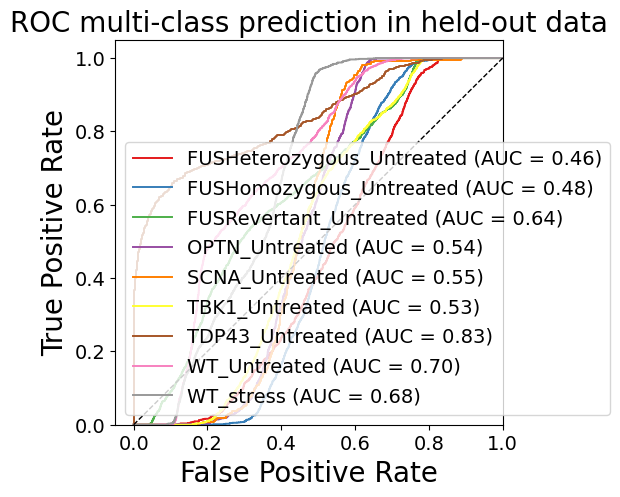

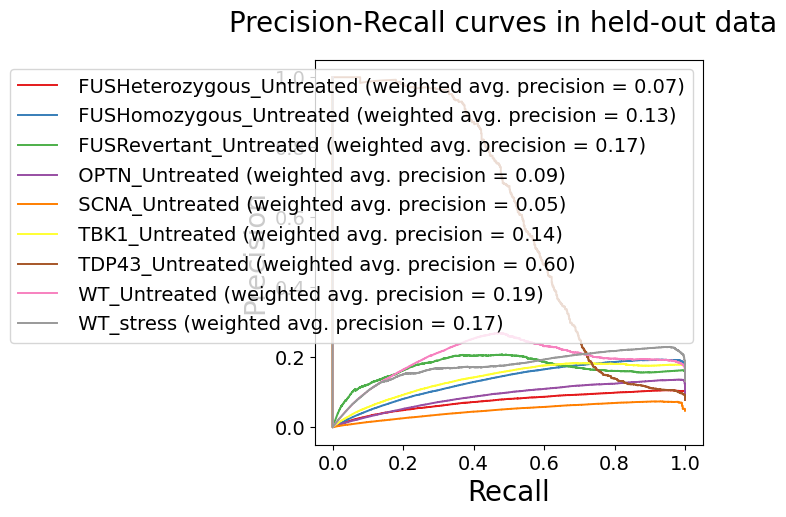

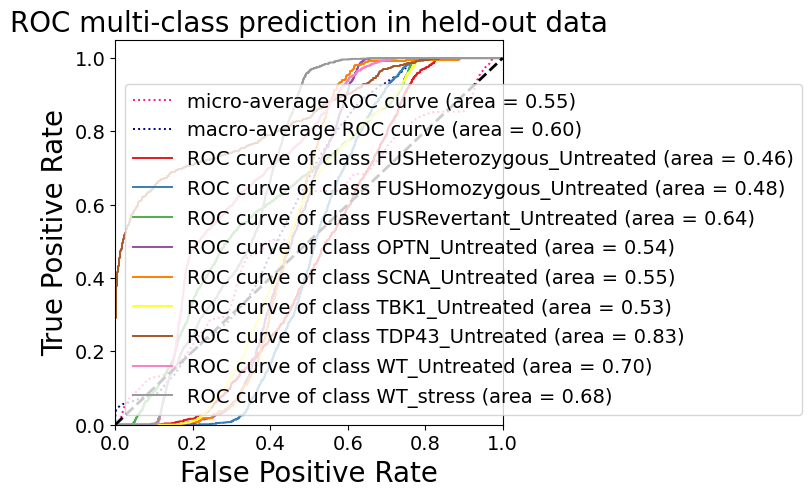


HELDOUT SET - AUC ROC scores of each class: {0: 0.4633979427962456, 1: 0.47519895145465085, 2: 0.6360325721994324, 3: 0.5418837495106651, 4: 0.5486764517954617, 5: 0.5296744139898788, 6: 0.8344408037323477, 7: 0.6989646716919444, 8: 0.6784211297043279, 'micro': 0.5450991315565564, 'macro': 0.6008039603203825}
'nHELDOUT SET - Classification Report: 
                           precision    recall  f1-score   support

FUSHeterozygous_Untreated       0.01      0.02      0.01       867
  FUSHomozygous_Untreated       0.00      0.00      0.00      1521
   FUSRevertant_Untreated       0.16      0.99      0.28      1291
           OPTN_Untreated       0.00      0.00      0.00       906
           SCNA_Untreated       0.00      0.00      0.00       465
           TBK1_Untreated       0.00      0.00      0.00      1447
          TDP43_Untreated       0.00      0.00      0.00       769
             WT_Untreated       0.00      0.00      0.00      1309
                WT_stress       0.00      0.

/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter t

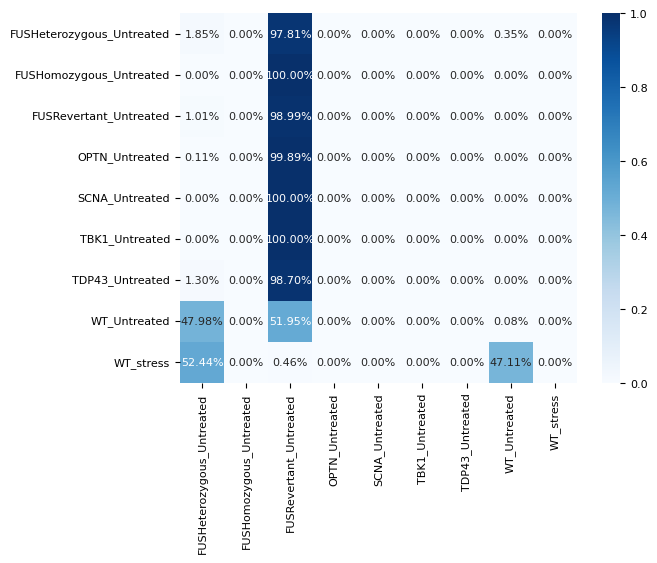


HELDOUT SET - One-vs-rest Confusion Matrix:
[[  16    0  848    0    0    0    0    3    0]
 [   0    0 1521    0    0    0    0    0    0]
 [  13    0 1278    0    0    0    0    0    0]
 [   1    0  905    0    0    0    0    0    0]
 [   0    0  465    0    0    0    0    0    0]
 [   0    0 1447    0    0    0    0    0    0]
 [  10    0  759    0    0    0    0    0    0]
 [ 628    0  680    0    0    0    0    1    0]
 [ 689    0    6    0    0    0    0  619    0]]
Sensitivity, hit rate, recall, or true positive rate: [1.84544406e-02 0.00000000e+00 9.89930287e-01 0.00000000e+00
 0.00000000e+00 0.00000000e+00 0.00000000e+00 7.63941940e-04
 0.00000000e+00]
Specificity or true negative rate: [0.85136333 1.         0.22877413 1.         1.         1.
 1.         0.92750583 1.        ]
Precision or positive predictive value: [0.01179071        nan 0.16158806        nan        nan        nan
        nan 0.00160514        nan]
Negative predictive value: [0.90025785 0.84619274 0.993434

/tmp/ipykernel_240846/3679406993.py:198: RuntimeWarning: invalid value encountered in divide
  PPV = TP / (TP + FP)
/tmp/ipykernel_240846/3679406993.py:210: RuntimeWarning: invalid value encountered in divide
  FDR = FP / (TP + FP)


In [84]:
mlp = mlp.fit(X9, y9)

val_classifier(mlp, X, y.reshape(-1,), np.unique(y.reshape(-1,)))

In [ ]:
#b6 2umaps
print('---- RFC -------')
fit_eval(rfc, X, y)
print("----- MLP ----")
fit_eval(mlp, X, y)

---- RFC -------
X_train shape (7911, 100), X_test shape: (1978, 100), y_train shape: (7911,), y_test shape: (1978,)


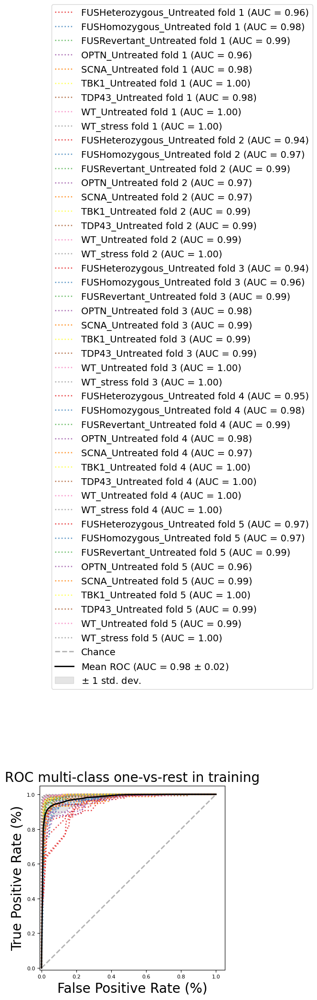



Training dataset (80%): K-Fold Cross Validation score: roc_auc_ovr_weighted [0.95715837 0.97764266 0.99267085 0.96336387 0.98204686 0.99526053
 0.98406838 0.99841903 0.99888149 0.93582265 0.97111085 0.99106916
 0.96846639 0.96570991 0.99379151 0.9896549  0.99432493 0.99864987
 0.93826062 0.96406937 0.99013263 0.97766659 0.98694351 0.99441651
 0.99209281 0.9976954  0.99965292 0.95099139 0.98160134 0.98633465
 0.97597245 0.97112696 0.99504616 0.99704665 0.99565632 0.99718694
 0.96512807 0.97311273 0.98788757 0.96240971 0.98717983 0.99502373
 0.98961032 0.99197441 0.99605574] Mean: 0.9821863905058996
Validating - Validate classifier

------------------

Balanced accuracy score: 0.7258143688390184. 
Balanced accuracy score (adjusted): 0.6915411649438957


One-vs-One ROC AUC scores:
0.974490 (macro),
0.975440 (weighted by prevalence)


One-vs-Rest ROC AUC scores:
0.974163 (macro),
0.977445 (weighted by prevalence)


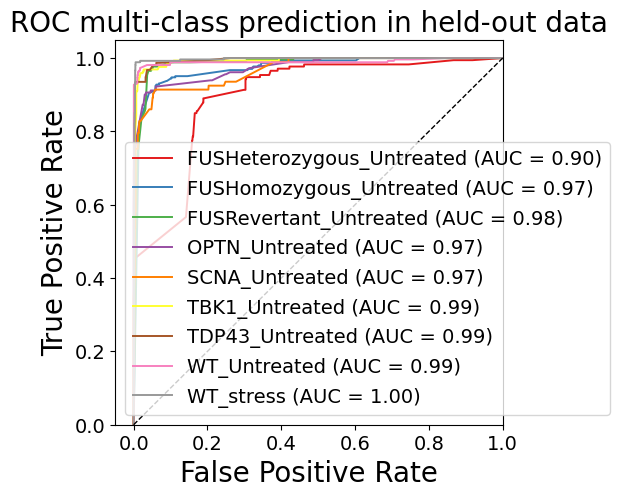

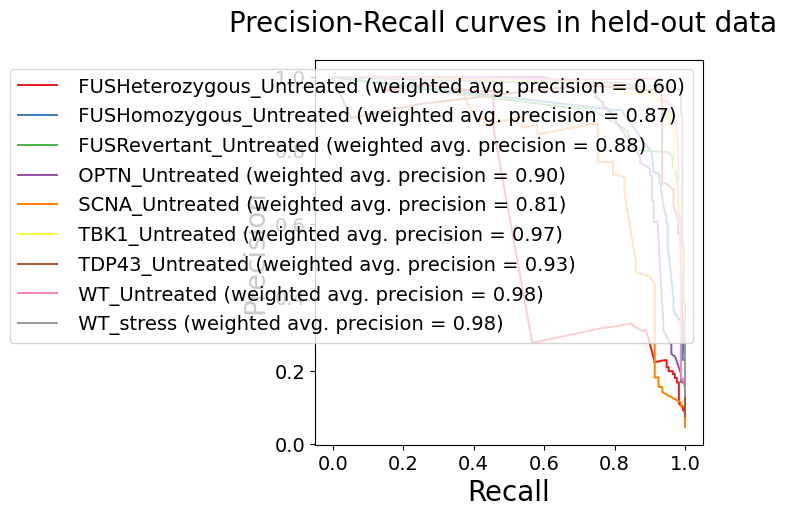

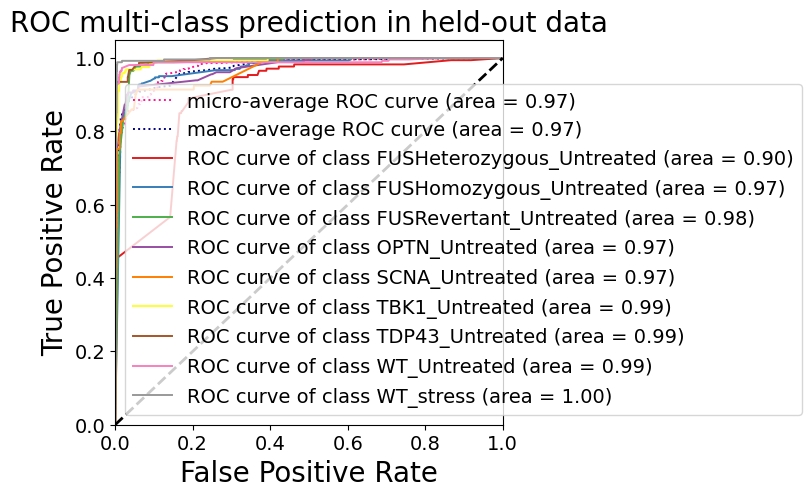


HELDOUT SET - AUC ROC scores of each class: {0: 0.8960818535538724, 1: 0.9720178582657361, 2: 0.9849625923922841, 3: 0.9738975640800966, 4: 0.9666894840420981, 5: 0.9927296126818108, 6: 0.994079659375712, 7: 0.9898385647431449, 8: 0.9971710139786496, 'micro': 0.9745992890961344, 'macro': 0.9741917436066266}
'nHELDOUT SET - Classification Report: 
                           precision    recall  f1-score   support

FUSHeterozygous_Untreated       0.98      0.24      0.38       173
  FUSHomozygous_Untreated       0.62      0.95      0.75       304
   FUSRevertant_Untreated       0.79      0.86      0.82       258
           OPTN_Untreated       0.98      0.71      0.82       181
           SCNA_Untreated       0.00      0.00      0.00        93
           TBK1_Untreated       0.71      0.97      0.82       290
          TDP43_Untreated       0.95      0.88      0.91       154
             WT_Untreated       0.99      0.95      0.97       262
                WT_stress       0.96      0.99

/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter t

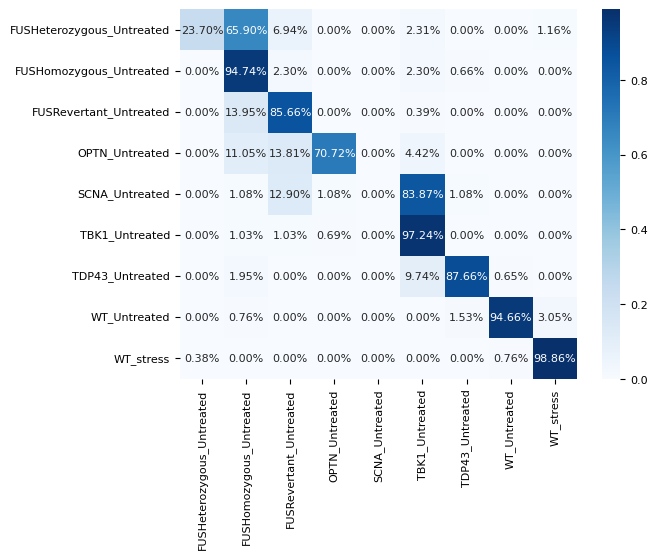


HELDOUT SET - One-vs-rest Confusion Matrix:
[[ 41 114  12   0   0   4   0   0   2]
 [  0 288   7   0   0   7   2   0   0]
 [  0  36 221   0   0   1   0   0   0]
 [  0  20  25 128   0   8   0   0   0]
 [  0   1  12   1   0  78   1   0   0]
 [  0   3   3   2   0 282   0   0   0]
 [  0   3   0   0   0  15 135   1   0]
 [  0   2   0   0   0   0   4 248   8]
 [  1   0   0   0   0   0   0   2 260]]
Sensitivity, hit rate, recall, or true positive rate: [0.23699422 0.94736842 0.85658915 0.70718232 0.         0.97241379
 0.87662338 0.94656489 0.98859316]
Specificity or true negative rate: [0.99944598 0.89307049 0.96569767 0.99833055 1.         0.93305687
 0.99616228 0.99825175 0.9941691 ]
Precision or positive predictive value: [0.97619048 0.61670236 0.78928571 0.97709924        nan 0.71392405
 0.95070423 0.98804781 0.96296296]
Negative predictive value: [0.93181818 0.98941099 0.97820966 0.97130482 0.95298281 0.9949463
 0.98965142 0.99189346 0.99824356]
Fall out or false positive rate: [0.0005

/tmp/ipykernel_240846/3679406993.py:198: RuntimeWarning: invalid value encountered in divide
  PPV = TP / (TP + FP)
/tmp/ipykernel_240846/3679406993.py:210: RuntimeWarning: invalid value encountered in divide
  FDR = FP / (TP + FP)
/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(


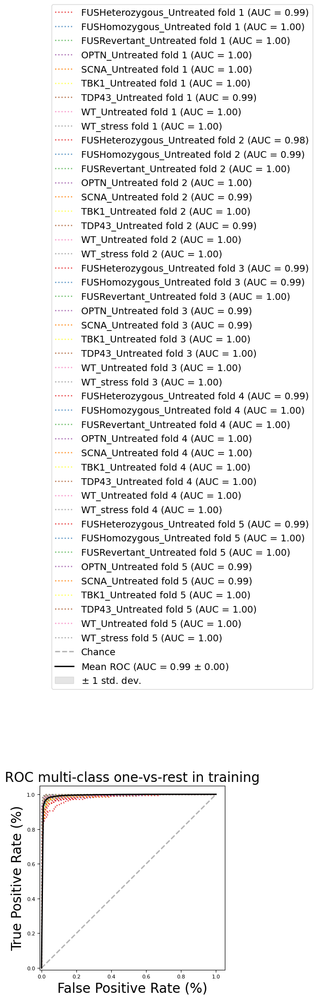



Training dataset (80%): K-Fold Cross Validation score: roc_auc_ovr_weighted [0.99264633 0.99720246 0.99829022 0.99632632 0.99612732 0.9968478
 0.99472102 0.99906326 0.99906357 0.98235092 0.99370237 0.99762926
 0.99610779 0.99412144 0.99587484 0.99277821 0.99727485 0.9989553
 0.98683299 0.99480295 0.99906544 0.989456   0.99370027 0.9969399
 0.99707451 0.99818131 0.99903165 0.9877653  0.9975198  0.99810277
 0.99563266 0.99787619 0.99654897 0.99906384 0.99855269 0.99916354
 0.98652595 0.99694816 0.99545015 0.99246035 0.99107277 0.99505898
 0.99784907 0.99635834 0.99848936] Mean: 0.9954357151386262
Validating - Validate classifier

------------------

Balanced accuracy score: 0.9142297418118596. 
Balanced accuracy score (adjusted): 0.9035084595383421


One-vs-One ROC AUC scores:
0.995199 (macro),
0.995541 (weighted by prevalence)


One-vs-Rest ROC AUC scores:
0.995529 (macro),
0.995978 (weighted by prevalence)


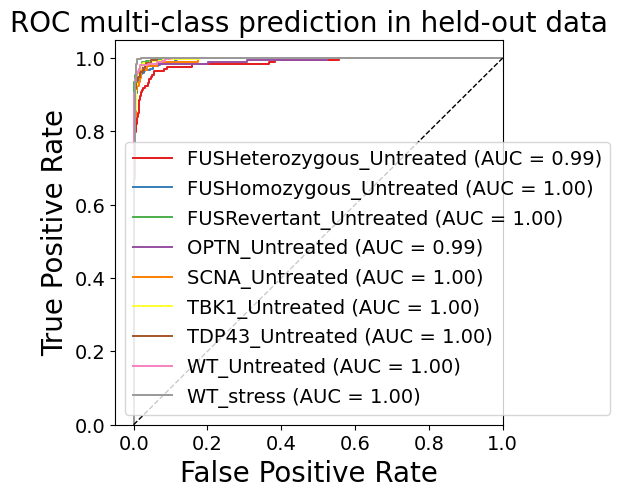

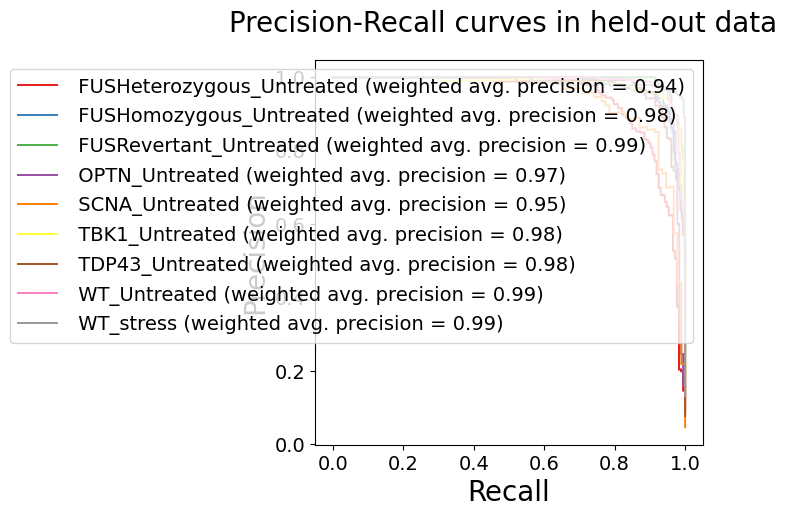

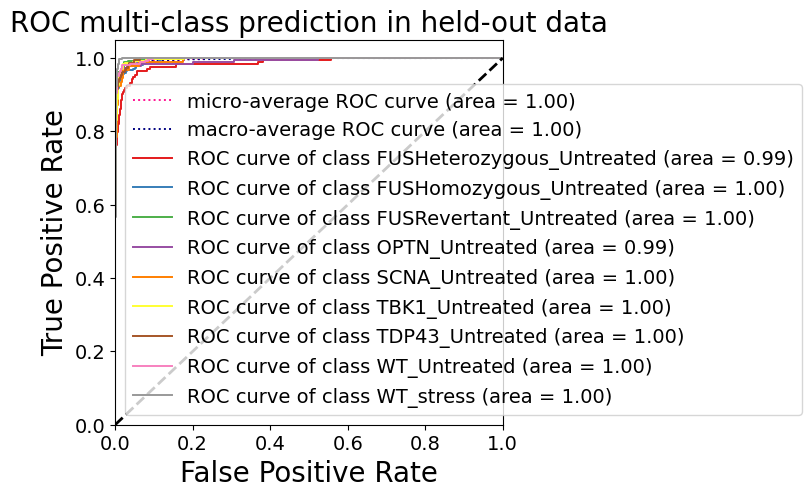


HELDOUT SET - AUC ROC scores of each class: {0: 0.9864025747362015, 1: 0.9957771332452996, 2: 0.998492428339643, 3: 0.992771869629247, 4: 0.9952653945979864, 5: 0.9968520183036444, 6: 0.9976646160856687, 7: 0.9978758518834855, 8: 0.9986608874945959, 'micro': 0.9961872687530479, 'macro': 0.9957078458203161}
'nHELDOUT SET - Classification Report: 
                           precision    recall  f1-score   support

FUSHeterozygous_Untreated       0.92      0.83      0.87       173
  FUSHomozygous_Untreated       0.95      0.90      0.93       304
   FUSRevertant_Untreated       0.93      0.97      0.95       258
           OPTN_Untreated       0.93      0.92      0.93       181
           SCNA_Untreated       0.83      0.84      0.83        93
           TBK1_Untreated       0.88      0.97      0.92       290
          TDP43_Untreated       0.96      0.88      0.92       154
             WT_Untreated       0.93      0.95      0.94       262
                WT_stress       0.96      0.96 

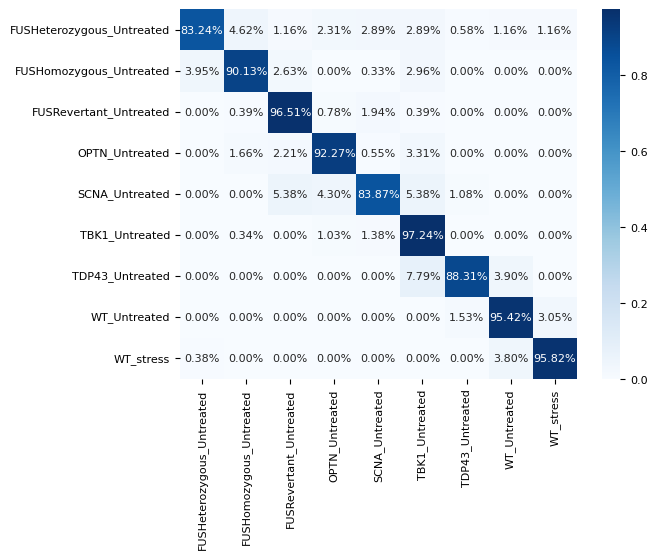


HELDOUT SET - One-vs-rest Confusion Matrix:
[[144   8   2   4   5   5   1   2   2]
 [ 12 274   8   0   1   9   0   0   0]
 [  0   1 249   2   5   1   0   0   0]
 [  0   3   4 167   1   6   0   0   0]
 [  0   0   5   4  78   5   1   0   0]
 [  0   1   0   3   4 282   0   0   0]
 [  0   0   0   0   0  12 136   6   0]
 [  0   0   0   0   0   0   4 250   8]
 [  1   0   0   0   0   0   0  10 252]]
Sensitivity, hit rate, recall, or true positive rate: [0.83236994 0.90131579 0.96511628 0.92265193 0.83870968 0.97241379
 0.88311688 0.95419847 0.9581749 ]
Specificity or true negative rate: [0.99279778 0.99223417 0.98895349 0.99276572 0.99151194 0.97748815
 0.99671053 0.98951049 0.9941691 ]
Precision or positive predictive value: [0.91719745 0.95470383 0.92910448 0.92777778 0.82978723 0.88125
 0.95774648 0.93283582 0.96183206]
Negative predictive value: [0.98407468 0.98225902 0.99473684 0.99221357 0.99203822 0.99517491
 0.99019608 0.99298246 0.99358974]
Fall out or false positive rate: [0.007202

In [80]:
#b6
print('---- RFC -------')
fit_eval(rfc, X, y)
print("----- MLP ----")
fit_eval(mlp, X, y)

X_train shape (7642, 100), X_test shape: (1911, 100), y_train shape: (7642,), y_test shape: (1911,)


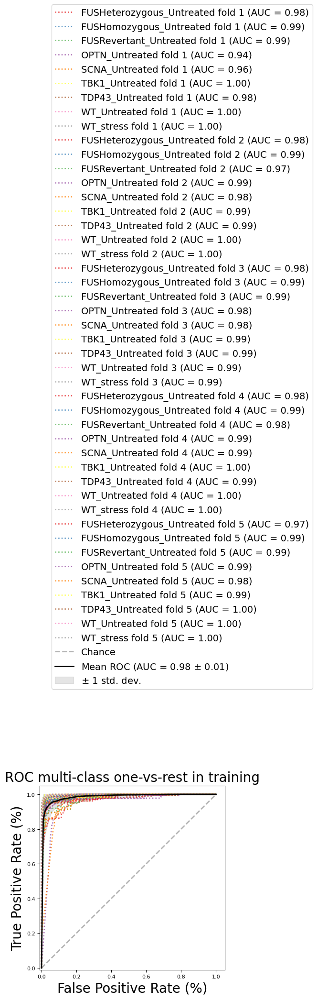



Training dataset (80%): K-Fold Cross Validation score: roc_auc_ovr_weighted [0.9802526  0.99371528 0.98920963 0.94324564 0.95814437 0.99887599
 0.97810101 0.99639326 0.99828959 0.98225109 0.99128796 0.97271154
 0.98871986 0.97640225 0.99467399 0.99052935 0.99549431 0.99853177
 0.98296192 0.98962948 0.98742694 0.97747369 0.97680561 0.9918493
 0.99225817 0.99287267 0.99334156 0.98163185 0.9920235  0.97631932
 0.9860812  0.99233858 0.99698681 0.99402426 0.99697428 0.99624679
 0.96863781 0.99483081 0.98761796 0.99290367 0.97809867 0.99063028
 0.99568055 0.99846878 0.99892873] Mean: 0.9873305035806601
Validating - Validate classifier

------------------

Balanced accuracy score: 0.8775624678399424. 
Balanced accuracy score (adjusted): 0.8622577763199353


One-vs-One ROC AUC scores:
0.986951 (macro),
0.988126 (weighted by prevalence)


One-vs-Rest ROC AUC scores:
0.988287 (macro),
0.989408 (weighted by prevalence)


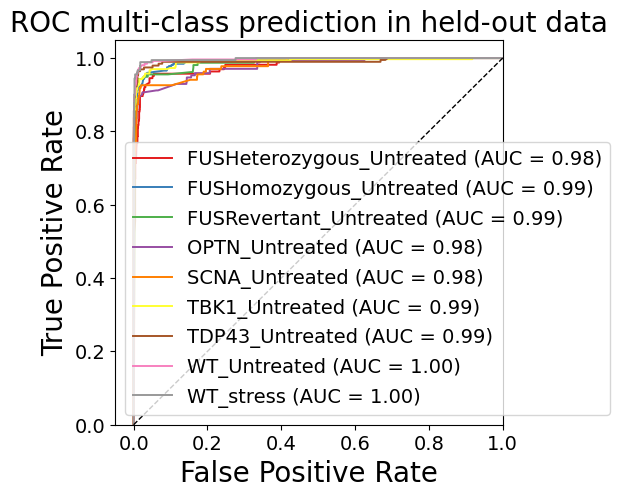

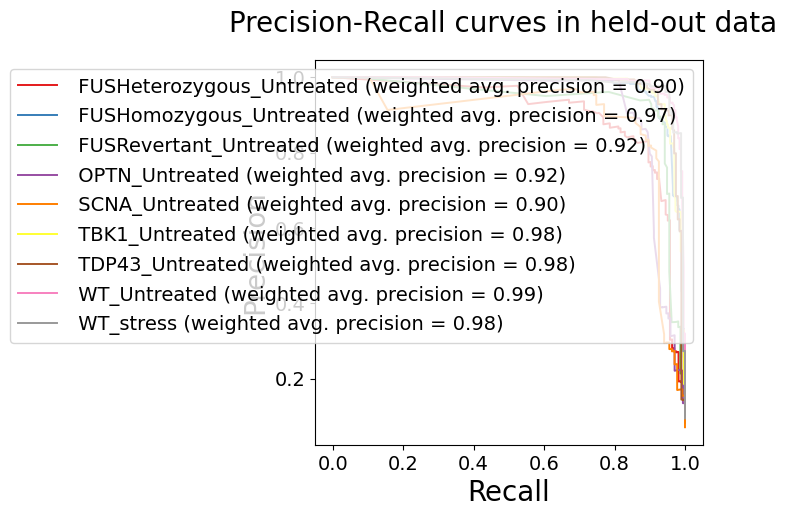

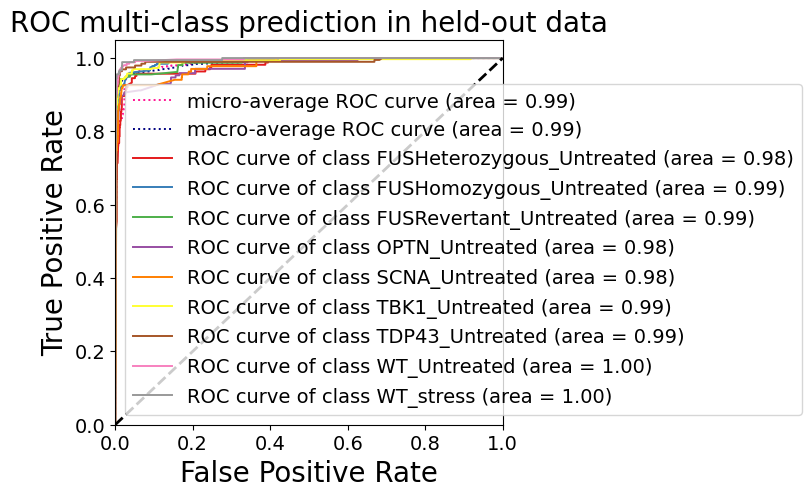


HELDOUT SET - AUC ROC scores of each class: {0: 0.9815816661314867, 1: 0.9910636963890359, 2: 0.9873355896258961, 3: 0.9784116633442578, 4: 0.9798590256923592, 5: 0.9911421086848445, 6: 0.9911915008068855, 7: 0.9968614733840749, 8: 0.9971387765581874, 'micro': 0.9873538132396621, 'macro': 0.9883162582990326}
'nHELDOUT SET - Classification Report: 
                           precision    recall  f1-score   support

FUSHeterozygous_Untreated       0.88      0.72      0.79       164
  FUSHomozygous_Untreated       0.83      0.96      0.89       321
   FUSRevertant_Untreated       0.91      0.76      0.83       157
           OPTN_Untreated       0.85      0.89      0.87       170
           SCNA_Untreated       0.91      0.79      0.85       135
           TBK1_Untreated       0.92      0.95      0.93       331
          TDP43_Untreated       0.96      0.91      0.93       195
             WT_Untreated       0.92      0.97      0.94       258
                WT_stress       0.94      0.9

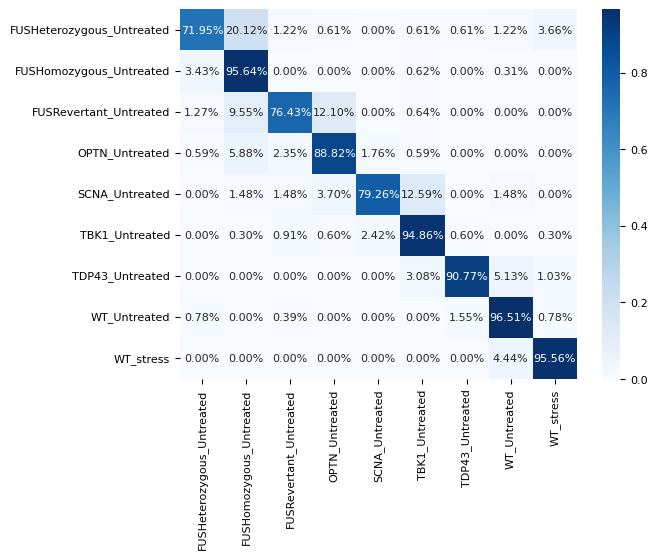


HELDOUT SET - One-vs-rest Confusion Matrix:
[[118  33   2   1   0   1   1   2   6]
 [ 11 307   0   0   0   2   0   1   0]
 [  2  15 120  19   0   1   0   0   0]
 [  1  10   4 151   3   1   0   0   0]
 [  0   2   2   5 107  17   0   2   0]
 [  0   1   3   2   8 314   2   0   1]
 [  0   0   0   0   0   6 177  10   2]
 [  2   0   1   0   0   0   4 249   2]
 [  0   0   0   0   0   0   0   8 172]]
Sensitivity, hit rate, recall, or true positive rate: [0.7195122  0.95638629 0.76433121 0.88823529 0.79259259 0.94864048
 0.90769231 0.96511628 0.95555556]
Specificity or true negative rate: [0.99084144 0.96163522 0.99315849 0.98449167 0.99380631 0.98227848
 0.99592075 0.9860859  0.99364529]
Precision or positive predictive value: [0.88059701 0.83423913 0.90909091 0.84831461 0.90677966 0.91812865
 0.96195652 0.91544118 0.93989071]
Negative predictive value: [0.97411367 0.99092677 0.9792018  0.98903635 0.98438371 0.98916507
 0.9895773  0.99450885 0.99537037]
Fall out or false positive rate: [0.009

/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(


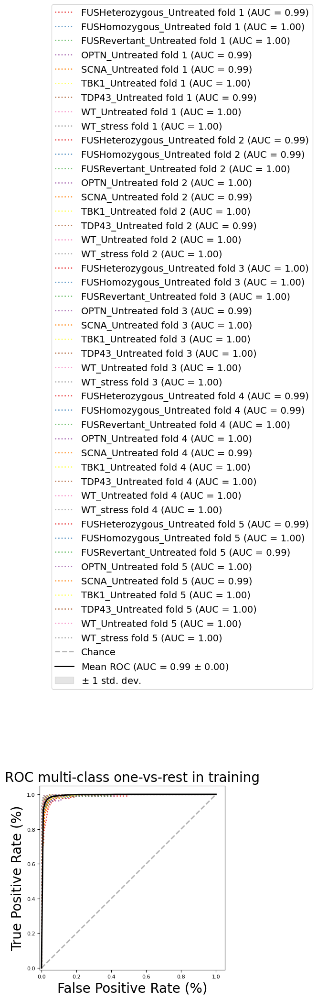



Training dataset (80%): K-Fold Cross Validation score: roc_auc_ovr_weighted [0.99120882 0.99663816 0.99779384 0.99192391 0.99383585 0.99850728
 0.99432741 0.99782938 0.9980575  0.99441405 0.99310807 0.99538404
 0.99698598 0.99224594 0.99699367 0.99493903 0.998922   0.99935923
 0.99526246 0.99723861 0.99700071 0.99413666 0.99522212 0.99562288
 0.99643511 0.99669888 0.99776212 0.99404394 0.99462417 0.99543835
 0.99508123 0.99419413 0.99850311 0.99812178 0.99646387 0.99809831
 0.9886671  0.99611201 0.99368781 0.99680944 0.99363164 0.9959127
 0.99865908 0.99901958 0.99929753] Mean: 0.9958715439275045
Validating - Validate classifier

------------------

Balanced accuracy score: 0.918697648029931. 
Balanced accuracy score (adjusted): 0.9085348540336725


One-vs-One ROC AUC scores:
0.995109 (macro),
0.995130 (weighted by prevalence)


One-vs-Rest ROC AUC scores:
0.995280 (macro),
0.995234 (weighted by prevalence)


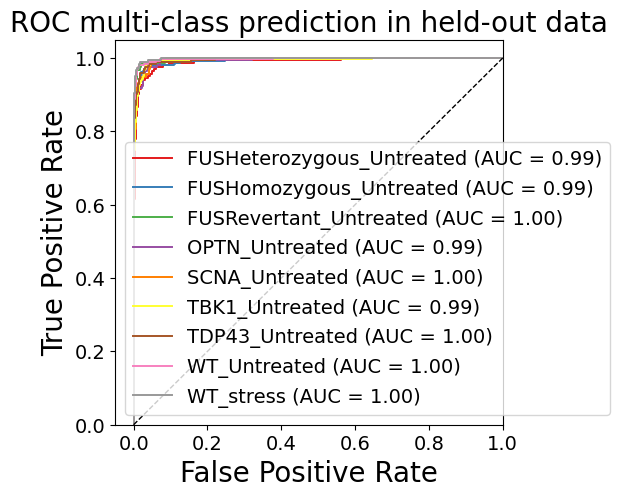

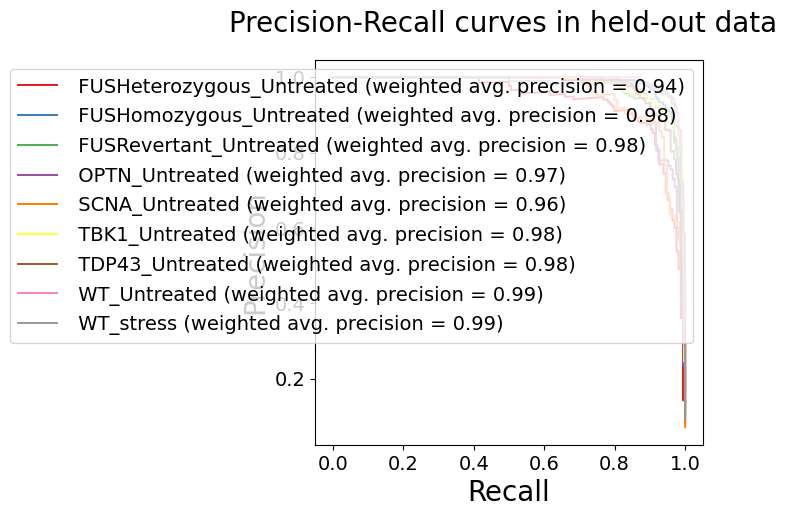

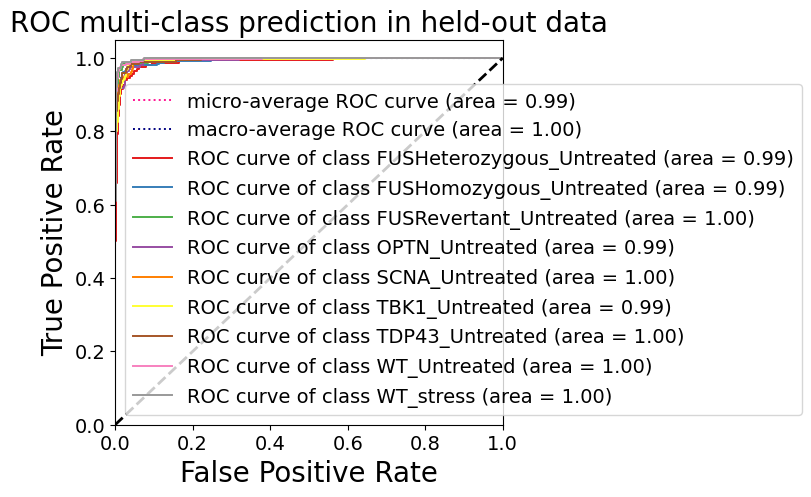


HELDOUT SET - AUC ROC scores of each class: {0: 0.9901014980384492, 1: 0.9947236427045985, 2: 0.9972220003050354, 3: 0.9943203703078014, 4: 0.9958583583583583, 5: 0.9940590462350377, 6: 0.9956846572231188, 7: 0.9971651261272669, 8: 0.998385647345786, 'micro': 0.9948740334196715, 'macro': 0.9954593240596505}
'nHELDOUT SET - Classification Report: 
                           precision    recall  f1-score   support

FUSHeterozygous_Untreated       0.84      0.91      0.87       164
  FUSHomozygous_Untreated       0.95      0.92      0.94       321
   FUSRevertant_Untreated       0.95      0.90      0.93       157
           OPTN_Untreated       0.94      0.89      0.92       170
           SCNA_Untreated       0.73      0.96      0.83       135
           TBK1_Untreated       0.94      0.89      0.92       331
          TDP43_Untreated       0.91      0.90      0.91       195
             WT_Untreated       0.97      0.92      0.95       258
                WT_stress       0.96      0.96

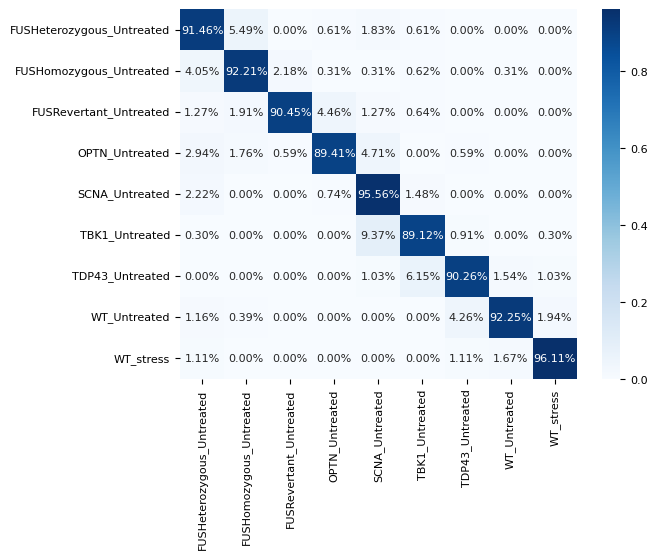


HELDOUT SET - One-vs-rest Confusion Matrix:
[[150   9   0   1   3   1   0   0   0]
 [ 13 296   7   1   1   2   0   1   0]
 [  2   3 142   7   2   1   0   0   0]
 [  5   3   1 152   8   0   1   0   0]
 [  3   0   0   1 129   2   0   0   0]
 [  1   0   0   0  31 295   3   0   1]
 [  0   0   0   0   2  12 176   3   2]
 [  3   1   0   0   0   0  11 238   5]
 [  2   0   0   0   0   0   2   3 173]]
Sensitivity, hit rate, recall, or true positive rate: [0.91463415 0.92211838 0.9044586  0.89411765 0.95555556 0.89123867
 0.9025641  0.92248062 0.96111111]
Specificity or true negative rate: [0.98340011 0.98993711 0.995439   0.99425617 0.97353604 0.98860759
 0.99009324 0.99576528 0.99537839]
Precision or positive predictive value: [0.83798883 0.94871795 0.94666667 0.9382716  0.73295455 0.94249201
 0.9119171  0.97142857 0.9558011 ]
Negative predictive value: [0.99191686 0.98436523 0.99148211 0.9897084  0.99654179 0.97747184
 0.98894063 0.9879952  0.99595376]
Fall out or false positive rate: [0.016

In [67]:
#b9
fit_eval(rfc, X, y)
fit_eval(mlp, X, y)

X_train shape (7642, 100), X_test shape: (1911, 100), y_train shape: (7642,), y_test shape: (1911,)


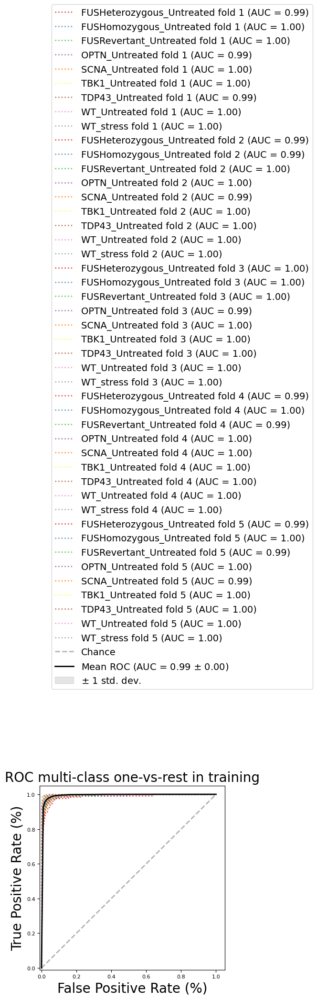



Training dataset (80%): K-Fold Cross Validation score: roc_auc_ovr_weighted [0.98944512 0.99637202 0.99765242 0.99399307 0.99730889 0.99877
 0.99405662 0.99749318 0.99770936 0.99379703 0.99450603 0.99645884
 0.99783582 0.99401178 0.99749821 0.99608288 0.99803036 0.99943491
 0.99566964 0.99642121 0.99736565 0.99444832 0.99601089 0.99628318
 0.99655192 0.99626192 0.99774205 0.99379259 0.99553647 0.99413257
 0.99609689 0.99780179 0.99896324 0.99809374 0.9950575  0.99796283
 0.99016977 0.99598037 0.9942181  0.99830369 0.99462084 0.99742452
 0.99891138 0.9989902  0.99960862] Mean: 0.9962861428355801
Validating - Validate classifier

------------------

Balanced accuracy score: 0.9191569238352795. 
Balanced accuracy score (adjusted): 0.9090515393146894


One-vs-One ROC AUC scores:
0.995311 (macro),
0.995331 (weighted by prevalence)


One-vs-Rest ROC AUC scores:
0.995514 (macro),
0.995456 (weighted by prevalence)


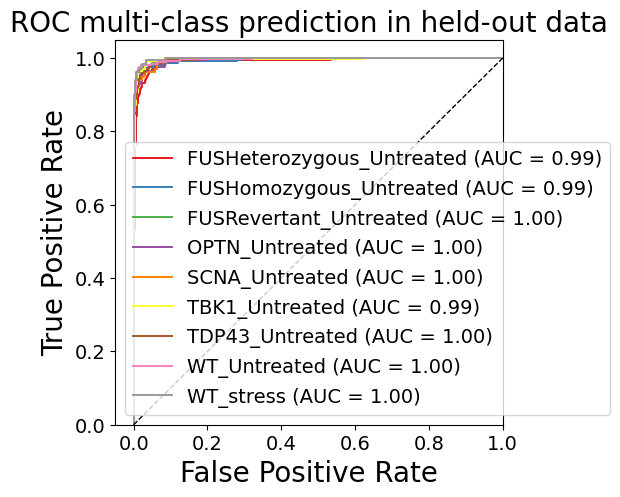

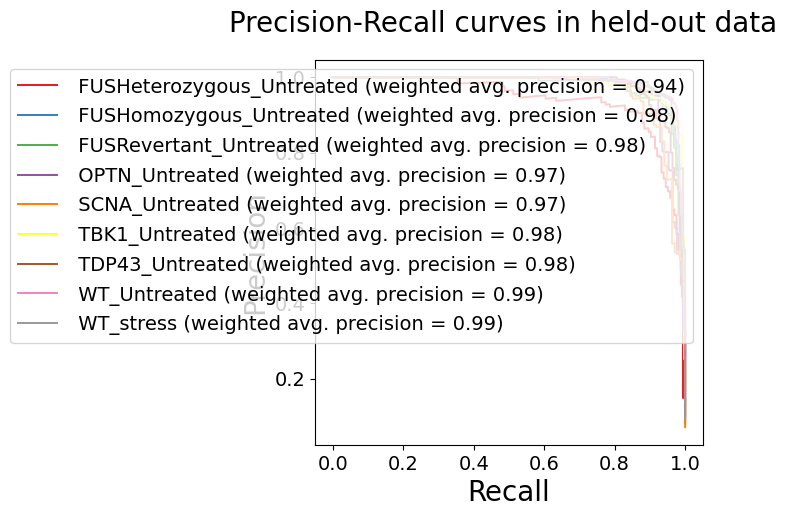

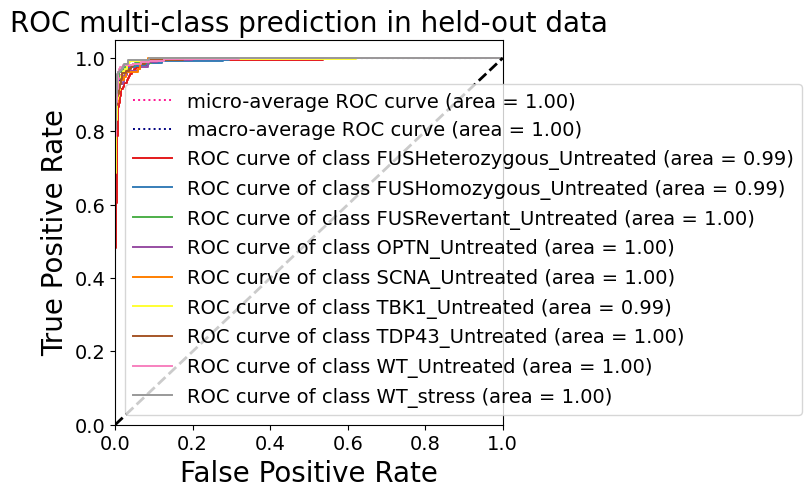


HELDOUT SET - AUC ROC scores of each class: {0: 0.9907227721389978, 1: 0.9944904876662943, 2: 0.9970585885582727, 3: 0.9952833057404467, 4: 0.9961086086086086, 5: 0.9949998087880989, 6: 0.9961299384376308, 7: 0.9966164408615765, 8: 0.9982155465690995, 'micro': 0.9953248235654605, 'macro': 0.9956839467502687}
'nHELDOUT SET - Classification Report: 
                           precision    recall  f1-score   support

FUSHeterozygous_Untreated       0.87      0.89      0.88       164
  FUSHomozygous_Untreated       0.93      0.93      0.93       321
   FUSRevertant_Untreated       0.92      0.94      0.93       157
           OPTN_Untreated       0.91      0.93      0.92       170
           SCNA_Untreated       0.94      0.86      0.90       135
           TBK1_Untreated       0.92      0.96      0.94       331
          TDP43_Untreated       0.90      0.91      0.91       195
             WT_Untreated       0.95      0.91      0.93       258
                WT_stress       0.95      0.9

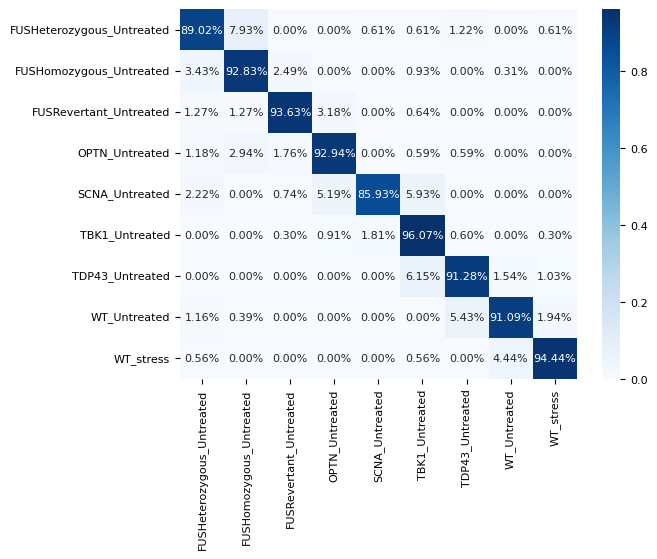


HELDOUT SET - One-vs-rest Confusion Matrix:
[[146  13   0   0   1   1   2   0   1]
 [ 11 298   8   0   0   3   0   1   0]
 [  2   2 147   5   0   1   0   0   0]
 [  2   5   3 158   0   1   1   0   0]
 [  3   0   1   7 116   8   0   0   0]
 [  0   0   1   3   6 318   2   0   1]
 [  0   0   0   0   0  12 178   3   2]
 [  3   1   0   0   0   0  14 235   5]
 [  1   0   0   0   0   1   0   8 170]]
Sensitivity, hit rate, recall, or true positive rate: [0.8902439  0.92834891 0.93630573 0.92941176 0.85925926 0.96072508
 0.91282051 0.91085271 0.94444444]
Specificity or true negative rate: [0.98740698 0.98679245 0.99258837 0.99138426 0.99605856 0.98291139
 0.98892774 0.99274047 0.99480069]
Precision or positive predictive value: [0.86904762 0.93416928 0.91875    0.9132948  0.94308943 0.92173913
 0.9035533  0.951417   0.94972067]
Negative predictive value: [0.98967298 0.98555276 0.99428898 0.99309551 0.9893736  0.9916986
 0.99008168 0.98617788 0.99422633]
Fall out or false positive rate: [0.0125

In [53]:
fit_eval(mlp, X, y)

In [ ]:
fit_eval(mlp, X, y)

#### vqvec2

In [28]:
X.shape

(9553, 100)

X_train shape (7642, 100), X_test shape: (1911, 100), y_train shape: (7642,), y_test shape: (1911,)


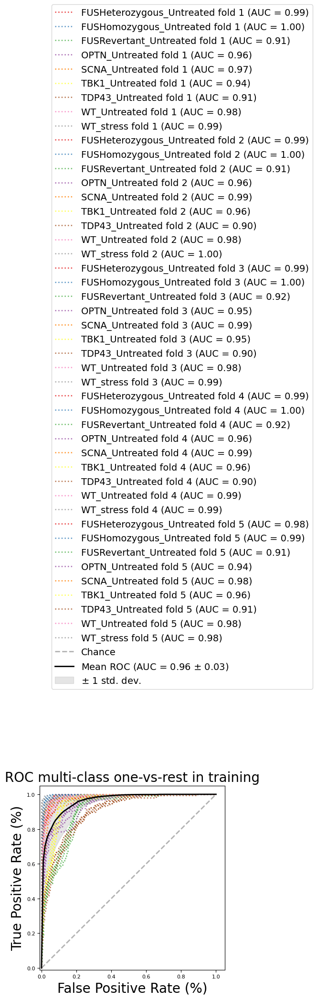



Training dataset (80%): K-Fold Cross Validation score: roc_auc_ovr_weighted [0.98973998 0.99556445 0.91250608 0.95522254 0.97499805 0.94454263
 0.90991559 0.98468869 0.99107458 0.99314724 0.99703889 0.90840489
 0.95800431 0.99233065 0.95804275 0.89741255 0.97795026 0.99669018
 0.99142181 0.99595282 0.92213828 0.94813852 0.98562756 0.95031297
 0.89823952 0.98467679 0.99422467 0.99260138 0.99667837 0.92094084
 0.95854404 0.98933866 0.95536533 0.89662293 0.98930717 0.99296022
 0.98118105 0.992123   0.91106486 0.9398208  0.97857388 0.9577227
 0.90648127 0.98409295 0.98483662] Mean: 0.9630280736781353
Validating - Validate classifier

------------------

Balanced accuracy score: 0.6969312196339784. 
Balanced accuracy score (adjusted): 0.6590476220882259


One-vs-One ROC AUC scores:
0.963415 (macro),
0.964348 (weighted by prevalence)


One-vs-Rest ROC AUC scores:
0.963971 (macro),
0.966425 (weighted by prevalence)


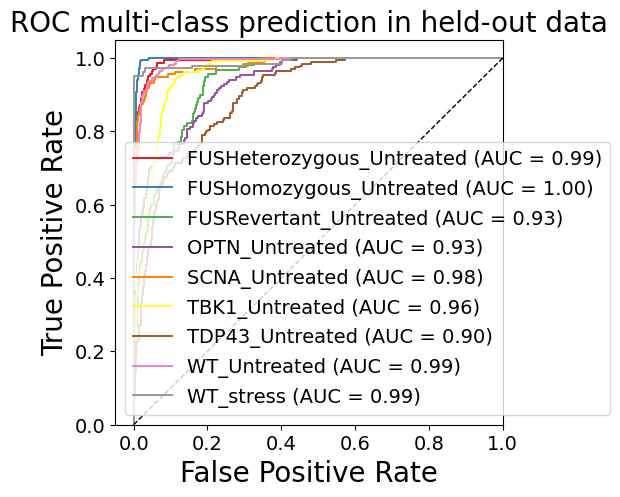

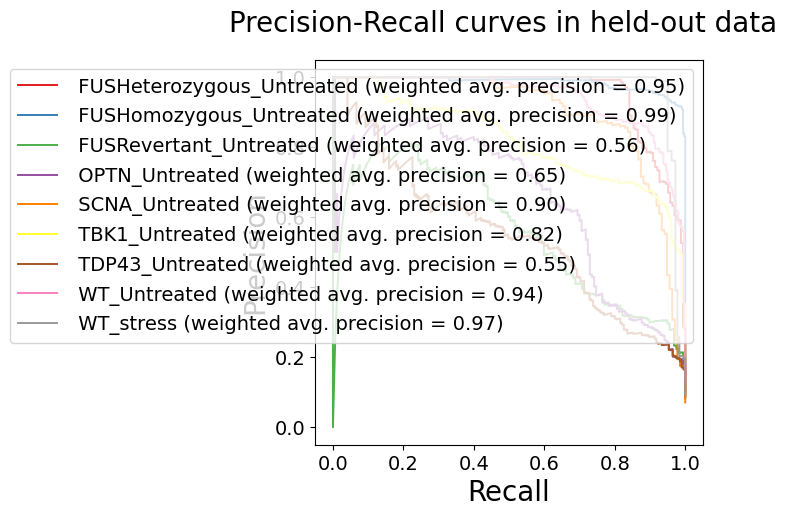

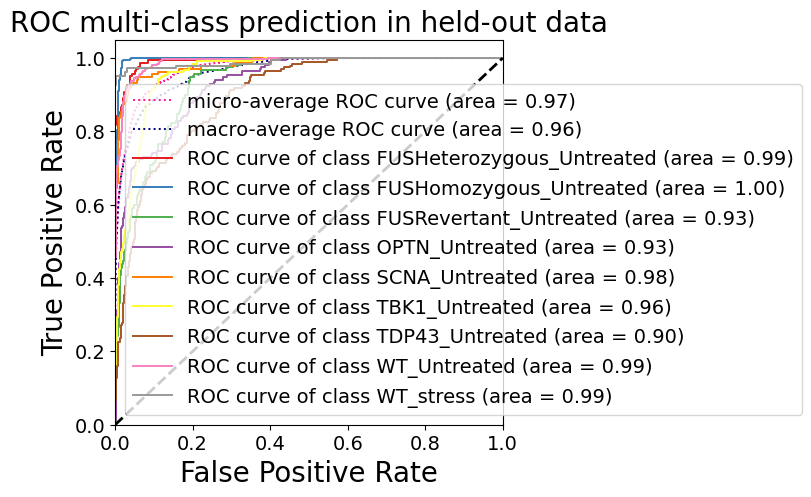


HELDOUT SET - AUC ROC scores of each class: {0: 0.9932706940120346, 1: 0.9974137424322577, 2: 0.9335749406270654, 3: 0.9319221542723926, 4: 0.9828036369703037, 5: 0.9595357375043022, 6: 0.8986701332855179, 7: 0.9885807810089242, 8: 0.9899672636241094, 'micro': 0.9729306507451833, 'macro': 0.9641732963096784}
'nHELDOUT SET - Classification Report: 
                           precision    recall  f1-score   support

FUSHeterozygous_Untreated       0.96      0.84      0.90       164
  FUSHomozygous_Untreated       0.93      0.97      0.95       321
   FUSRevertant_Untreated       0.42      0.03      0.06       157
           OPTN_Untreated       0.69      0.61      0.65       170
           SCNA_Untreated       0.92      0.66      0.77       135
           TBK1_Untreated       0.52      0.98      0.68       331
          TDP43_Untreated       0.59      0.46      0.51       195
             WT_Untreated       0.89      0.79      0.84       258
                WT_stress       0.99      0.9

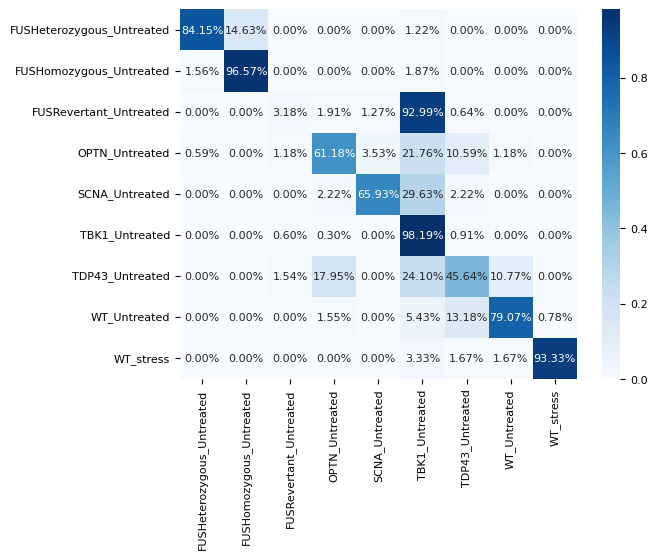


HELDOUT SET - One-vs-rest Confusion Matrix:
[[138  24   0   0   0   2   0   0   0]
 [  5 310   0   0   0   6   0   0   0]
 [  0   0   5   3   2 146   1   0   0]
 [  1   0   2 104   6  37  18   2   0]
 [  0   0   0   3  89  40   3   0   0]
 [  0   0   2   1   0 325   3   0   0]
 [  0   0   3  35   0  47  89  21   0]
 [  0   0   0   4   0  14  34 204   2]
 [  0   0   0   0   0   6   3   3 168]]
Sensitivity, hit rate, recall, or true positive rate: [0.84146341 0.96573209 0.03184713 0.61176471 0.65925926 0.98187311
 0.45641026 0.79069767 0.93333333]
Specificity or true negative rate: [0.99656554 0.98490566 0.99600912 0.9735784  0.9954955  0.81139241
 0.96386946 0.98427102 0.9988446 ]
Precision or positive predictive value: [0.95833333 0.92814371 0.41666667 0.69333333 0.91752577 0.52166934
 0.58940397 0.88695652 0.98823529]
Negative predictive value: [0.9852858  0.99302473 0.91995787 0.96252129 0.97464168 0.99534161
 0.93977273 0.96787626 0.99310741]
Fall out or false positive rate: [0.003

In [39]:
fit_eval(mlp, X, y)

X_train shape (7642, 100), X_test shape: (1911, 100), y_train shape: (7642,), y_test shape: (1911,)


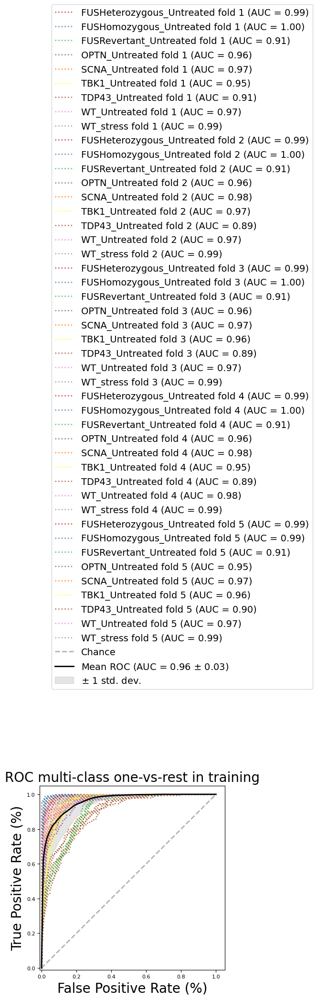



Training dataset (80%): K-Fold Cross Validation score: roc_auc_ovr_weighted [0.99204425 0.99595294 0.91053751 0.9593556  0.96858629 0.95109267
 0.91224065 0.97433986 0.99235613 0.99384617 0.99636285 0.9089932
 0.95991512 0.9823025  0.96538393 0.88690776 0.96916179 0.99424313
 0.99199956 0.99573852 0.91461155 0.95865555 0.97466235 0.96186677
 0.88811019 0.97212961 0.99341181 0.99292923 0.99699982 0.9064804
 0.95941613 0.97898119 0.95243729 0.89050235 0.97569878 0.99011521
 0.98696771 0.99307815 0.90863578 0.94781846 0.96870777 0.95612722
 0.90238376 0.97298885 0.98743076] Mean: 0.9607223802704624
Validating - Validate classifier

------------------

Balanced accuracy score: 0.7289774446980075. 
Balanced accuracy score (adjusted): 0.6950996252852585


One-vs-One ROC AUC scores:
0.963666 (macro),
0.965217 (weighted by prevalence)


One-vs-Rest ROC AUC scores:
0.964978 (macro),
0.967835 (weighted by prevalence)


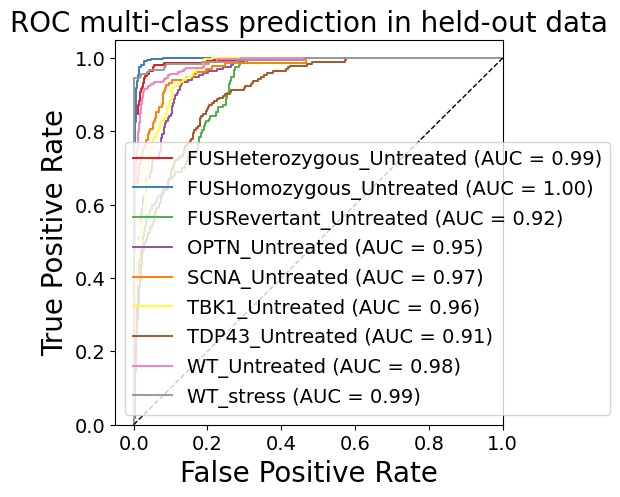

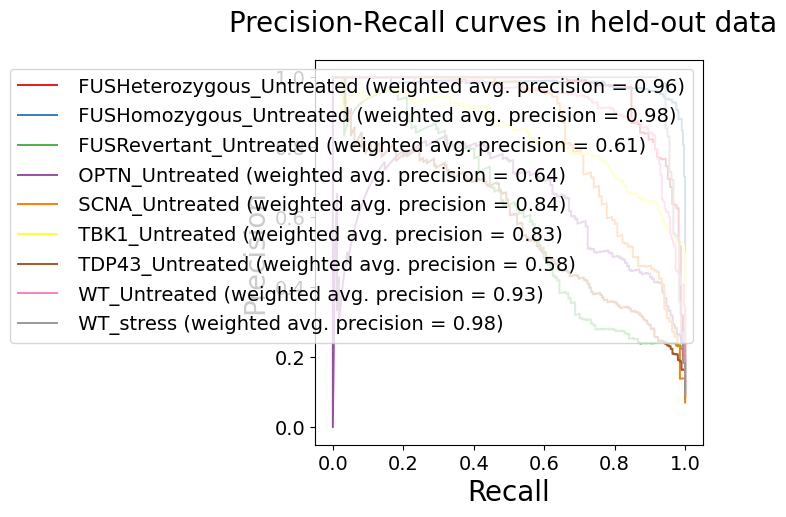

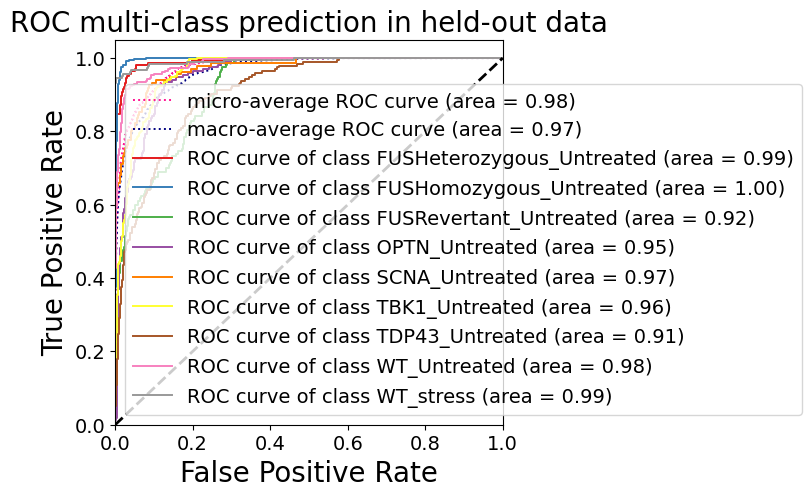


HELDOUT SET - AUC ROC scores of each class: {0: 0.9928204448043335, 1: 0.9968984502047454, 2: 0.9182687070136322, 3: 0.9549988174477143, 4: 0.9709209209209209, 5: 0.9634727905464836, 6: 0.9097483712868328, 7: 0.9848900519140673, 8: 0.9927851595095963, 'micro': 0.9751205940654247, 'macro': 0.9651787226474781}
'nHELDOUT SET - Classification Report: 
                           precision    recall  f1-score   support

FUSHeterozygous_Untreated       0.97      0.85      0.90       164
  FUSHomozygous_Untreated       0.92      0.98      0.95       321
   FUSRevertant_Untreated       0.84      0.27      0.41       157
           OPTN_Untreated       0.70      0.62      0.66       170
           SCNA_Untreated       0.81      0.70      0.75       135
           TBK1_Untreated       0.58      0.93      0.72       331
          TDP43_Untreated       0.62      0.36      0.45       195
             WT_Untreated       0.80      0.92      0.85       258
                WT_stress       0.99      0.9

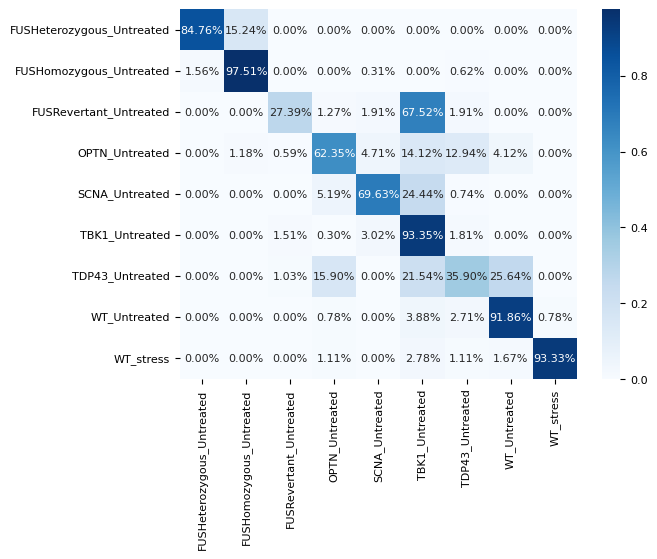


HELDOUT SET - One-vs-rest Confusion Matrix:
[[139  25   0   0   0   0   0   0   0]
 [  5 313   0   0   1   0   2   0   0]
 [  0   0  43   2   3 106   3   0   0]
 [  0   2   1 106   8  24  22   7   0]
 [  0   0   0   7  94  33   1   0   0]
 [  0   0   5   1  10 309   6   0   0]
 [  0   0   2  31   0  42  70  50   0]
 [  0   0   0   2   0  10   7 237   2]
 [  0   0   0   2   0   5   2   3 168]]
Sensitivity, hit rate, recall, or true positive rate: [0.84756098 0.97507788 0.27388535 0.62352941 0.6962963  0.93353474
 0.35897436 0.91860465 0.93333333]
Specificity or true negative rate: [0.99713795 0.98301887 0.995439   0.97415279 0.98761261 0.86075949
 0.97494172 0.96370236 0.9988446 ]
Precision or positive predictive value: [0.96527778 0.92058824 0.84313725 0.70198675 0.81034483 0.58412098
 0.61946903 0.7979798  0.98823529]
Negative predictive value: [0.98585173 0.9949077  0.93870968 0.96363636 0.97715877 0.98408104
 0.93047831 0.98698885 0.99310741]
Fall out or false positive rate: [0.002

In [40]:
fit_eval(mlp, X9, y9)

X_train shape (4771, 100), X_test shape: (1193, 100), y_train shape: (4771,), y_test shape: (1193,)


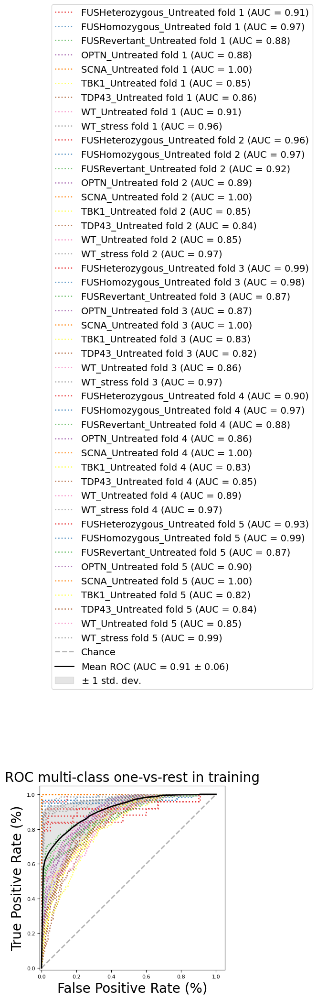



Training dataset (80%): K-Fold Cross Validation score: roc_auc_ovr_weighted [0.90968493 0.97214582 0.88433778 0.88359415 1.         0.84685038
 0.86392892 0.90620926 0.96158988 0.95801971 0.97365667 0.91616541
 0.89188116 1.         0.84734283 0.84265396 0.84909467 0.97279052
 0.9938172  0.97874176 0.86534151 0.86769844 1.         0.83086005
 0.81932937 0.86355622 0.96741514 0.9016577  0.96644209 0.88218829
 0.86320069 1.         0.83098592 0.85161283 0.89069283 0.97017139
 0.92898746 0.99045277 0.87144946 0.90432664 1.         0.81721966
 0.83971539 0.84535637 0.9854113 ] Mean: 0.9112572561615584
Validating - Validate classifier

------------------

Balanced accuracy score: 0.6306941750735573. 
Balanced accuracy score (adjusted): 0.584530946957752


One-vs-One ROC AUC scores:
0.940808 (macro),
0.926067 (weighted by prevalence)


One-vs-Rest ROC AUC scores:
0.922597 (macro),
0.900475 (weighted by prevalence)


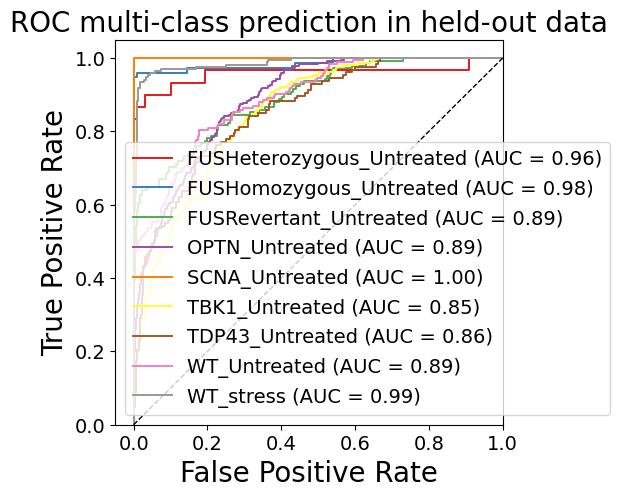

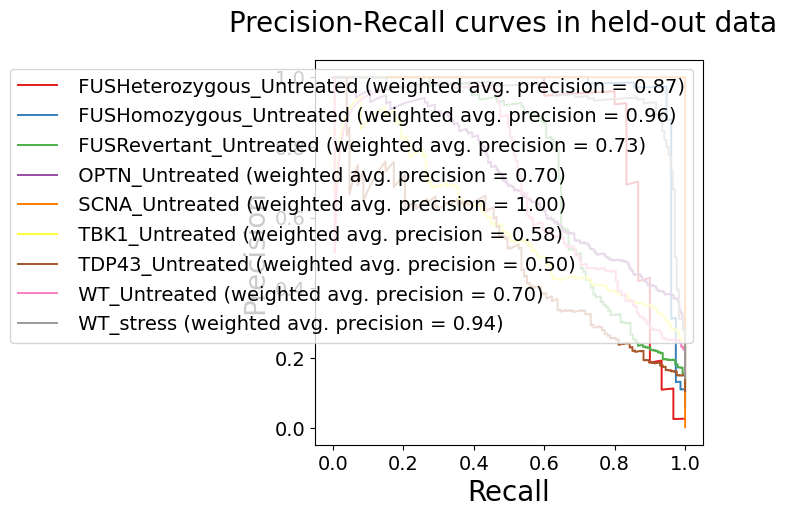

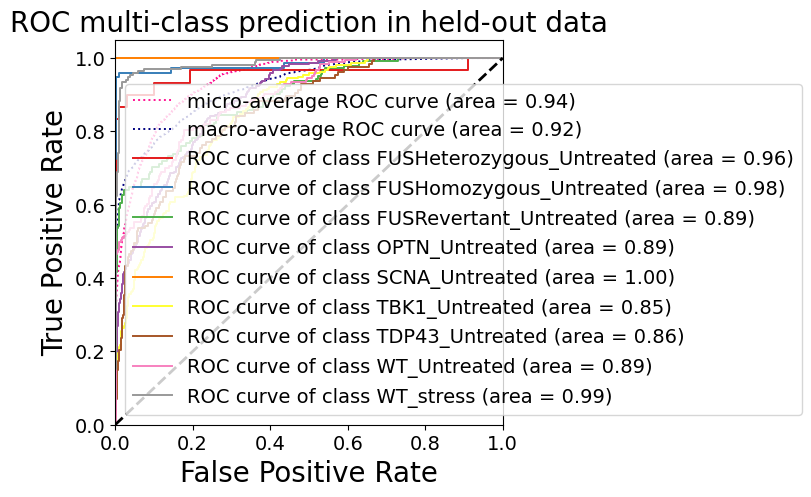


HELDOUT SET - AUC ROC scores of each class: {0: 0.9582688449412439, 1: 0.9848513405267869, 2: 0.8922421302314362, 3: 0.8866571945233791, 4: 1.0, 5: 0.8511505364115395, 6: 0.8557415313704922, 7: 0.8887680571335821, 8: 0.9856937496406186, 'micro': 0.937576453593152, 'macro': 0.9232305339195503}
'nHELDOUT SET - Classification Report: 
                           precision    recall  f1-score   support

FUSHeterozygous_Untreated       0.00      0.00      0.00        30
  FUSHomozygous_Untreated       0.73      0.96      0.83        76
   FUSRevertant_Untreated       0.70      0.64      0.67       142
           OPTN_Untreated       0.53      0.72      0.61       245
           SCNA_Untreated       1.00      1.00      1.00         4
           TBK1_Untreated       0.58      0.39      0.47       216
          TDP43_Untreated       0.54      0.46      0.50       127
             WT_Untreated       0.65      0.55      0.60       183
                WT_stress       0.75      0.95      0.84     

/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/labs/hornsteinlab/sagyk/anaconda3/envs/cytoself_torch/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter t

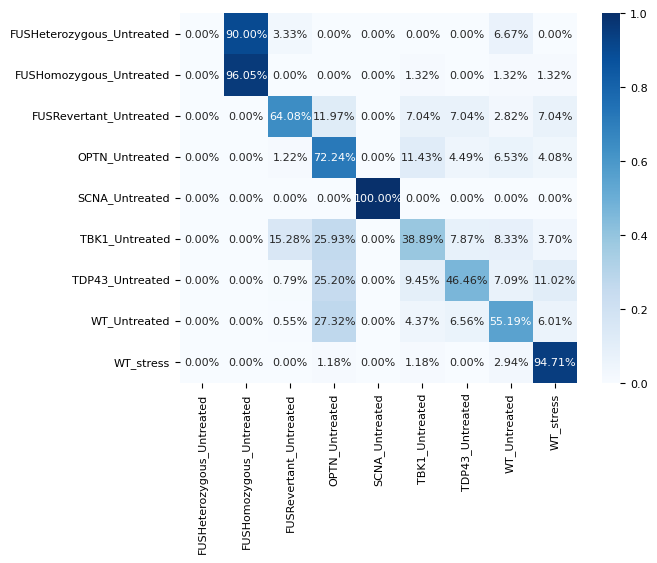


HELDOUT SET - One-vs-rest Confusion Matrix:
[[  0  27   1   0   0   0   0   2   0]
 [  0  73   0   0   0   1   0   1   1]
 [  0   0  91  17   0  10  10   4  10]
 [  0   0   3 177   0  28  11  16  10]
 [  0   0   0   0   4   0   0   0   0]
 [  0   0  33  56   0  84  17  18   8]
 [  0   0   1  32   0  12  59   9  14]
 [  0   0   1  50   0   8  12 101  11]
 [  0   0   0   2   0   2   0   5 161]]
Sensitivity, hit rate, recall, or true positive rate: [0.         0.96052632 0.64084507 0.72244898 1.         0.38888889
 0.46456693 0.55191257 0.94705882]
Specificity or true negative rate: [1.         0.97582811 0.96289248 0.83438819 1.         0.93756397
 0.95309568 0.94554455 0.94721408]
Precision or positive predictive value: [       nan 0.73       0.7        0.52994012 1.         0.57931034
 0.5412844  0.6474359  0.74883721]
Negative predictive value: [0.97485331 0.99725526 0.95202258 0.92083818 1.         0.8740458
 0.93726937 0.92092575 0.99079755]
Fall out or false positive rate: [0.    

/tmp/ipykernel_240846/3679406993.py:198: RuntimeWarning: invalid value encountered in divide
  PPV = TP / (TP + FP)
/tmp/ipykernel_240846/3679406993.py:210: RuntimeWarning: invalid value encountered in divide
  FDR = FP / (TP + FP)


In [41]:
fit_eval(mlp, X5, y5)

In [ ]:
fit_eval(mlp, X, y)

#### y shuffled

##### vqvec1

In [ ]:
y_shuffled = np.copy(y)
np.random.shuffle(y_shuffled)
fit_eval(rfc, X, y_shuffled)

##### vqvec2

In [ ]:
y_shuffled = np.copy(y)
np.random.shuffle(y_shuffled)
fit_eval(mlp, X, y_shuffled)

---------------------

# Old

In [ ]:
# from sklearn.model_selection import StratifiedKFold

# clf = mlp
# unique_labels = np.unique(y)

# skf = StratifiedKFold(n_splits=5, random_state=1, shuffle=True)
# result = fit_and_plot_multiclass_cv_auc_roc_curves(clf, skf, X_train, y_train,
#                                                     n_classes=len(unique_labels),
#                                                     class_names=unique_labels,
#                                                     colors=plt.cm.get_cmap('Set1', len(unique_labels)).colors,
#                                                     title='ROC multi-class one-vs-rest in training')

# print("\n\nTraining dataset (75%): K-Fold Cross Validation score: " + str(model_scorer) + " " + str(
#     result) + " Mean: " + str(result.mean()))


In [ ]:


# clf_trained = clf.fit(X_train, y_train)
# validate_classifier(clf_trained, X_test, y_test, 'roc_auc_ovr_weighted',
#                     unique_labels, sample_weight=None, colors=plt.cm.get_cmap('Set1', len(unique_labels)).colors,
#                     title='Validate classifier', show_plot=True)

-----------------------

# Plot

In [ ]:

groups = np.unique(labels_flat)
colors = cm.get_cmap('Set1').colors

for i, g in enumerate(groups):
    ind = np.where(labels_flat == g)
    plt.scatter(x[ind,0], x[ind,1], c=colors[i])
plt.legend(groups)
plt.show()

In [ ]:

groups = np.unique(labels_flat)
colors = cm.get_cmap('Set1').colors

for i, g in enumerate(groups):
    ind = np.where(labels_flat == g)
    plt.scatter(x[ind,0], x[ind,1], c=colors[i])
plt.legend(groups)
plt.show()

In [ ]:

groups = np.unique(labels_flat)
colors = cm.get_cmap('Set1').colors

for i, g in enumerate(groups):
    ind = np.where(labels_flat == g)
    plt.scatter(x[ind,0], x[ind,1], c=colors[i])
plt.legend(groups)
plt.show()

In [ ]:
# 50 umaps
groups = np.unique(labels_flat)
colors = cm.get_cmap('Set1').colors

for i, g in enumerate(groups):
    ind = np.where(labels_flat == g)
    plt.scatter(x[ind,0], x[ind,1], c=colors[i])
plt.legend(groups)
plt.show()

In [ ]:
# 50 umaps multi
groups = np.unique(label_data.reshape(-1,))
colors = cm.get_cmap('Set1').colors

for i, g in enumerate(groups):
    ind = np.where(label_data.reshape(-1,) == g)
    plt.scatter(x[ind,0], x[ind,1], c=colors[i])
plt.legend(groups)
plt.show()

# Models

In [ ]:
from sklearn.model_selection import train_test_split
labels_flat = label_data.reshape(-1,)
X_train, X_test, y_train, y_test = train_test_split(x, labels_flat, test_size=.2, stratify=labels_flat, random_state=1)
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

In [ ]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(hidden_layer_sizes=(50,), activation='relu', random_state=1)
mlp.fit(X_train, y_train)

In [ ]:
mlp.n_layers_

In [ ]:
# for i in range(5):
#     print(mlp.predict(X_test[[i]]), y_test[i])

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rfc = RandomForestClassifier(n_estimators=20, max_depth=3, random_state=1)
rfc.fit(X_train, y_train)

### Plots

In [ ]:

    # for i, l in enumerate(unique_labels):
    #     print(l)
    #     disp = ConfusionMatrixDisplay(conf_matrix[i])
    #     disp.plot()
    #     plt.show()

In [ ]:
plot_conf_matrix(rfc, 'true')

In [ ]:
plot_conf_matrix(rfc, 'true')

In [ ]:
plot_conf_matrix(mlp, 'true')

In [ ]:
plot_conf_matrix(rfc, 'true')

In [ ]:
plot_conf_matrix(mlp, 'true')

### Utils

### Reports

In [ ]:
def cv_report(get_clf, x, labels_flat):
    from sklearn.metrics import classification_report
    from sklearn.model_selection import StratifiedKFold

    skf = StratifiedKFold(n_splits=5, random_state=1, shuffle=True)
    for i, (train_index, test_index) in enumerate(skf.split(x, labels_flat)):
        print(i)
        print(train_index[:2], test_index[:2])
        x_train, y_train = x[train_index], labels_flat[train_index]
        x_test, y_test = x[test_index], labels_flat[test_index]

        print(x_train.shape, y_train.shape, x_test.shape, y_test.shape)

        clf = get_clf() #MLPClassifier(hidden_layer_sizes=(50,), activation='relu', random_state=1)
        clf.fit(x_train, y_train)

        predictions = clf.predict(x_test)
        print(classification_report(y_test, predictions))
        
        

In [ ]:
from sklearn.model_selection import StratifiedKFold

skf = StratifiedKFold(n_splits=5, random_state=1, shuffle=True)
fit_and_plot_multiclass_cv_auc_roc_curves(mlp, skf, x, labels_flat)

In [ ]:
cv_report(lambda : MLPClassifier(hidden_layer_sizes=(50,), activation='relu', random_state=1), x, labels_flat)

In [ ]:
# from sklearn.metrics import classification_report
# from sklearn.model_selection import StratifiedKFold

# skf = StratifiedKFold(n_splits=5, random_state=1, shuffle=True)
# for i, (train_index, test_index) in enumerate(skf.split(x, labels_flat)):
#     print(i)
#     print(train_index[:2], test_index[:2])
#     x_train, y_train = x[train_index], labels_flat[train_index]
#     x_test, y_test = x[test_index], labels_flat[test_index]

#     print(x_train.shape, y_train.shape, x_test.shape, y_test.shape)

#     mlp = MLPClassifier(hidden_layer_sizes=(50,), activation='relu', random_state=1)
#     mlp.fit(x_train, y_train)

#     predictions = mlp.predict(x_test)
#     print(classification_report(y_test, predictions))

### 2 UMAPS

In [ ]:
plot_conf_matrix(mlp)

In [ ]:
plot_conf_matrix(rfc)

### 100 UMAPS

In [ ]:
plot_conf_matrix(mlp)

In [ ]:
plot_conf_matrix(rfc)

# PLOTS old

In [ ]:
plot_conf_matrix(rfc)

In [ ]:
plot_conf_matrix(mlp)

In [ ]:
plot_conf_matrix(rfc)

In [ ]:
plot_conf_matrix(mlp)

In [ ]:
plot_conf_matrix(rfc)

In [ ]:
# def plot_conf_matrix(clf):
#     from sklearn.metrics import ConfusionMatrixDisplay, multilabel_confusion_matrix, confusion_matrix

#     unique_labels = np.unique(mlp.classes_)

#     predictions = clf.predict(X_test)
#     conf_matrix = confusion_matrix(y_test, predictions, labels=unique_labels)

#     import seaborn as sns

#     sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=unique_labels, yticklabels=unique_labels)
#     plt.show()
#     # for i, l in enumerate(unique_labels):
#     #     print(l)
#     #     disp = ConfusionMatrixDisplay(conf_matrix[i])
#     #     disp.plot()
#     #     plt.show()
    
# # plot_conf_matrix(rfc)

In [ ]:
#50 umaps
def plot_conf_matrix(clf):
    from sklearn.metrics import ConfusionMatrixDisplay, multilabel_confusion_matrix, confusion_matrix

    unique_labels = np.unique(mlp.classes_)

    predictions = clf.predict(X_test)
    conf_matrix = confusion_matrix(y_test, predictions, labels=unique_labels)

    import seaborn as sns

    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=unique_labels, yticklabels=unique_labels)
    plt.show()
    # for i, l in enumerate(unique_labels):
    #     print(l)
    #     disp = ConfusionMatrixDisplay(conf_matrix[i])
    #     disp.plot()
    #     plt.show()
    
plot_conf_matrix(rfc)

In [ ]:
#Multiplex

def plot_conf_matrix(clf):
    from sklearn.metrics import ConfusionMatrixDisplay, multilabel_confusion_matrix, confusion_matrix

    unique_labels = np.unique(mlp.classes_)

    predictions = clf.predict(X_test)
    conf_matrix = confusion_matrix(y_test, predictions, labels=unique_labels)

    import seaborn as sns

    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=unique_labels, yticklabels=unique_labels)
    plt.show()
    # for i, l in enumerate(unique_labels):
    #     print(l)
    #     disp = ConfusionMatrixDisplay(conf_matrix[i])
    #     disp.plot()
    #     plt.show()
    
plot_conf_matrix(rfc)

In [ ]:
#multi 50umaps
plot_conf_matrix(mlp)

In [ ]:
plot_conf_matrix(mlp)

In [ ]:
#50umaps
plot_conf_matrix(mlp)

In [ ]:
from xgboost import XGBClassifier

# create model instance
bst = XGBClassifier(n_estimators=20, max_depth=4, learning_rate=0.1, objective='multi:softmax')
# fit model
bst.fit(X_train, y_train)
# # make predictions
# preds = bst.predict(X_test)